In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.optimize import curve_fit
import scipy.constants as spc

## Trial 1

In [2]:
base = "e:\\ansys\\resonator_v1"

In [3]:
def plot(x, y, *args, xlabel=None, ylabel=None, title=None, **kwargs):
    plt.plot(x, y, *args, **kwargs)
    plt.grid(True)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)

def plot_ax(ax, x, y, *args, xlabel=None, ylabel=None, title=None, **kwargs):
    ax.plot(x, y, *args, **kwargs)
    ax.grid(True)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title)

def read_S21(file):
    df = pd.read_csv(f'{base}/{file}.csv')
    return np.array(df['Freq [GHz]']), np.array(df[df.keys()[1]])

def read_S11(file):
    df = pd.read_csv(f'{base}/{file}.csv')
    try:
        return np.array(df['Freq [GHz]']), np.array(df['dB(St(feedline1_T1,feedline1_T1)) []'])
    except KeyError:
        if 'dB(St(feedline_T1,feedline_T1)) []' in df:
            return np.array(df['Freq [GHz]']), np.array(df['dB(St(feedline_T1,feedline_T1)) []'])
        elif 'dB(St(Feedline_T1,Feedline_T1)) []' in df:
            return np.array(df['Freq [GHz]']), np.array(df['dB(St(Feedline_T1,Feedline_T1)) []'])
        else: 
            return read_S21(file) 


def S21_mag_old(f, f0, Qi, Qc):
    return abs(1- (get_Q(Qi, Qc)/Qc)/(1+2j*get_Q(Qi,Qc)*(f-f0)/f0))
    #return 1 - h*(w/2)/np.pi / ((w/2)**2 + (f-f0)**2)

def S21_mag(f, f0, Q, Qc, a, alpha, t, phi):
    if Q > Qc or Q < 0 or Qc < 0:
        return 1e6
    return abs( a*np.exp(1j*alpha-2*np.pi*1j*f*t)*(1- (Q/Qc)*np.exp(1j*phi)/(1+2j*Q*(f-f0)/f0)) )
    #return 1 - h*(w/2)/np.pi / ((w/2)**2 + (f-f0)**2)

def S11_mag(f, f0, Q, Qc, a, alpha, t, phi):
    if Q > Qc or Q < 0 or Qc < 0:
        return 1e6
    return abs( a*np.exp(1j*alpha-2*np.pi*1j*f*t)*(1- 2*(Q/Qc)*np.exp(1j*phi)/(1+2j*Q*(f-f0)/f0)) )

def S21_mag_noguchi(f, f0, kin, kex, a, phi):
    if kin < 0 or kex < 0: 
        return 1e6
    return abs( a*(1-kex*np.exp(1j*phi) / (1j*(f-f0) + (kin+kex)/2)))
    
def cutoff_x0(x, y, x0):
    if len(np.shape(x0)) > 0: 
        ind = np.where((x > x0[0]) & (x < x0[1]))
        return x[ind], y[ind]
    ind = np.where(x < x0)
    return x[ind], y[ind]

def dB_to_percent(dB):
    return 10**(dB/20)

def percent_to_dB(per):
    return 20*np.log10(per)

def get_S11_fit(f, S_dB, f0=2):
    init = [f0, 20, 30, 1, 0, 0, 0.5] 
    param = curve_fit(S11_mag, f, dB_to_percent(S_dB), p0=init, maxfev=100000)[0]
    return param

def get_S21_fit(f, S_dB, f0=2):
    init = [f0, 20, 30, 1, 0, 0, 0.5] 
    param = curve_fit(S21_mag, f, dB_to_percent(S_dB), p0=init, maxfev=100000)[0]
    return param

def get_S21_fit_noguchi(f, S_dB):
    init = [2, 2/30, 2/30, 1, 0.5]
    param = curve_fit(S21_mag_noguchi, f, dB_to_percent(S_dB), p0=init, maxfev=100000)[0]
    return param

def get_Qi(Q, Qc):
    return 1 / (1/Q - 1/Qc)

def get_Q(Qi, Qc):
    return 1 / (1/Qi + 1/Qc)

def plot_S21(name, cutoff_freq=3, f0_guess=2): 
    f, S = cutoff_x0(*read_S21(name), cutoff_freq)

    f0, Q, Qc_mag, a, alpha, t, phi = get_S21_fit(f, S, f0=f0_guess)
    plot(f, S, '.', label='Ansys Simulation')
    
    ft = np.linspace(min(f), max(f), 500000)
    St = S21_mag(ft, f0, Q, Qc_mag, a, alpha, t, phi)
    St_dB = percent_to_dB(St)

    Qc = Qc_mag*np.exp(-1j*phi).real
    plot(ft, St_dB, '--', label=f'Fit, $f_0$ = {f0:.2f}GHz, \n$Q_i$ = {get_Qi(Q, Qc):.2f}, \n$Q_c$ = {Qc:.2f}, \n$Q$ = {Q:.2f}')

    id0 = np.where(ft < f0)[0][-1]
    idl, idr = np.argmin(abs(St_dB[:id0]-(max(St_dB)-3))), id0+np.argmin(abs(St_dB[id0:]-(max(St_dB)-3)))
    plot(ft[idl], St_dB[idl], 'gX')
    plot(ft[idr], St_dB[idr], 'gX', label=f'-3dB, $Q$ = {f0/abs(ft[idr]-ft[idl]):.2f}', xlabel='f (GHz)', ylabel='$|S_{21}|$ (dB)')
    plt.legend()

def plot_S11(name, cutoff_freq=3, f0_guess=2): 
    f, S = cutoff_x0(*read_S11(name), cutoff_freq)

    f0, Q, Qc_mag, a, alpha, t, phi = get_S11_fit(f, S, f0=f0_guess)
    plot(f, S, '.', label='Ansys Simulation')
    
    ft = np.linspace(min(f), max(f), 500000)
    St = S11_mag(ft, f0, Q, Qc_mag, a, alpha, t, phi)
    St_dB = percent_to_dB(St)

    Qc = Qc_mag*np.exp(-1j*phi).real
    plot(ft, St_dB, '--', label=f'Fit, $f_0$ = {f0:.2f}GHz, \n$Q_i$ = {get_Qi(Q, Qc):.2f}, \n$Q_c$ = {Qc:.2f}, \n$Q$ = {Q:.2f}')

    id0 = np.where(ft < f0)[0][-1]
    idl, idr = np.argmin(abs(St_dB[:id0]-(max(St_dB)-3))), id0+np.argmin(abs(St_dB[id0:]-(max(St_dB)-3)))
    plot(ft[idl], St_dB[idl], 'gX')
    plot(ft[idr], St_dB[idr], 'gX', label=f'-3dB, $Q$ = {f0/abs(ft[idr]-ft[idl]):.2f}', xlabel='f (GHz)', ylabel='$|S_{11}|$ (dB)')
    plt.legend()
    #plt.show()

In [4]:
dB_to_percent(-10)  # this is the max Q/Qi at -10dB

0.31622776601683794

In [5]:
def remove_mm(data):
    data = np.array(data)
    data_rm = [i[:-2] for i in data]
    return np.array(data_rm, dtype=np.float64)

## Single side spiral

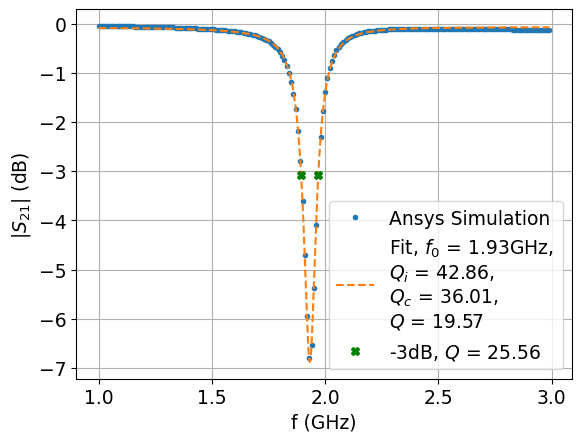

In [475]:
plot_S21('spiral_v1-0')

In [448]:
df = pd.read_csv(f'{base}/spiral_v1-0_Q_opt_1.csv')
D_gnd, D_gnd0, W_res_vert, Q, Dc = remove_mm(df['D_gnd']), remove_mm(df['D_gnd0']), remove_mm(df['W_spiral']), -np.array(df['Cost']), remove_mm(df['D_couple'])

In [346]:
idx = np.argmax(Q)
D_gnd[idx], D_gnd0[idx]+2*D_gnd[idx], W_res_vert[idx], Dc[idx]

(0.0953070149776245, 0.329715026400835, 0.103003914223834, 0.0426409290735657)

In [347]:
df = pd.read_csv(f'{base}/spiral_v1-0_Q_opt_1.csv')
D_gnd, D_gnd0, W_res_vert, Q = remove_mm(df['D_gnd']), remove_mm(df['D_gnd0']), remove_mm(df['W_spiral']), -np.array(df['Cost'])

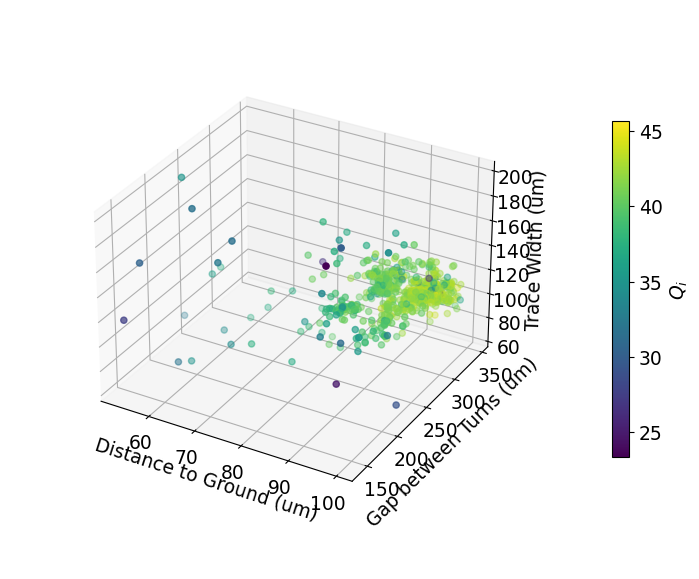

In [348]:
fig = plt.figure(figsize=(9,6))
ax = fig.add_subplot(projection='3d')

ax.scatter(D_gnd*1000, (2*D_gnd+D_gnd0)*1000, W_res_vert*1e3, '.', c=Q)
ax.set_xlabel('Distance to Ground (um)')
ax.set_ylabel('Gap between Turns (um)')
ax.set_zlabel('Trace Width (um)')
ax.set_box_aspect(aspect=None, zoom=0.8)
sm = plt.cm.ScalarMappable(cmap='viridis')
sm.set_array(Q)
cbar = plt.colorbar(sm, ax=ax, pad=0.05, shrink=0.6)
cbar.set_label('$Q_i$')
plt.tight_layout()
plt.show()

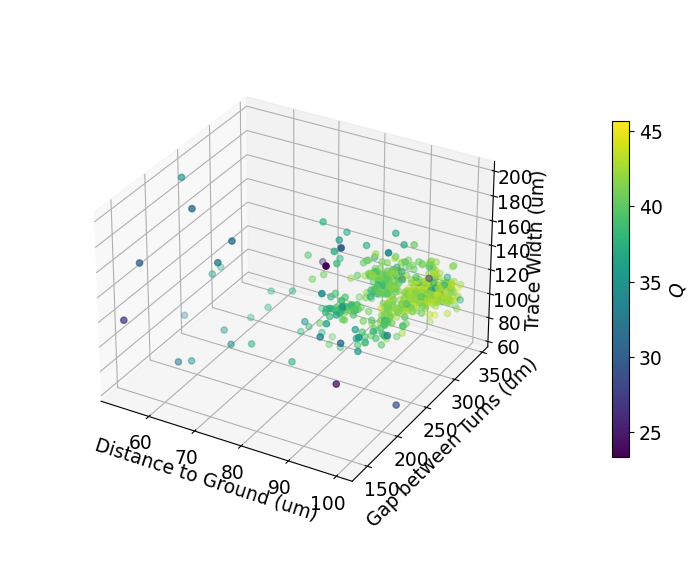

In [349]:
fig = plt.figure(figsize=(9,6))
ax = fig.add_subplot(projection='3d')

ax.scatter(D_gnd*1000, (2*D_gnd+D_gnd0)*1000, W_res_vert*1e3, '.', c=Q)
ax.set_xlabel('Distance to Ground (um)')
ax.set_ylabel('Gap between Turns (um)')
ax.set_zlabel('Trace Width (um)')
ax.set_box_aspect(aspect=None, zoom=0.8)
sm = plt.cm.ScalarMappable(cmap='viridis')
sm.set_array(Q)
cbar = plt.colorbar(sm, ax=ax, pad=0.05, shrink=0.6)
cbar.set_label('$Q$')
plt.tight_layout()
plt.show()

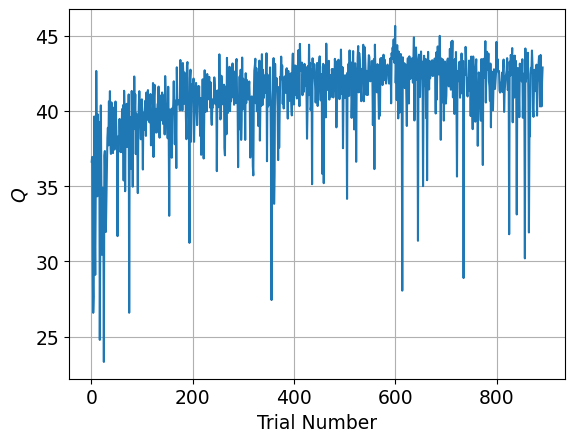

In [350]:
plot(df['Evaluation'], Q, xlabel='Trial Number', ylabel='$Q$')

## Two-side Spiral

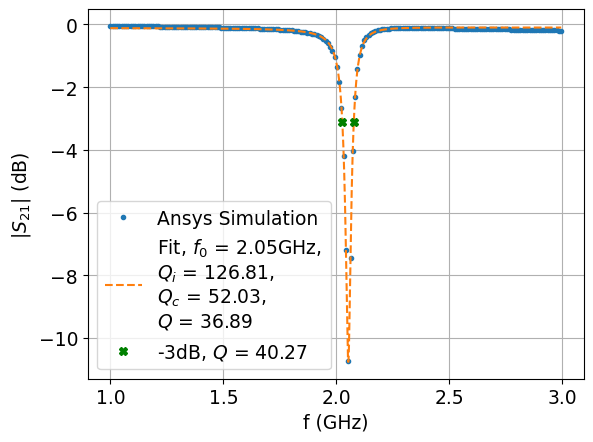

In [451]:
plot_S21('spiral_v1-1', 3)

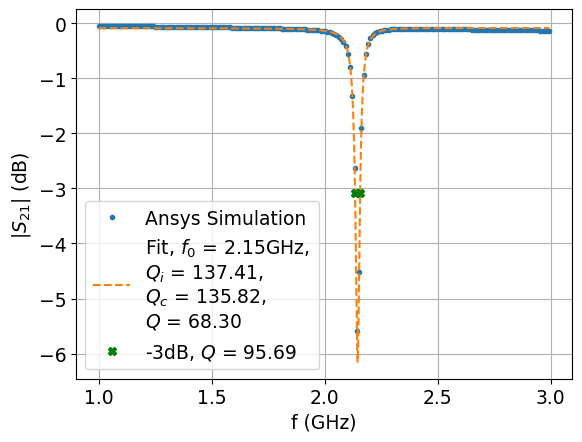

In [452]:
plot_S21('spiral_v1-1_tuneQc', 3)

In [352]:
df = pd.read_csv(f'{base}/spiral_v1-1_opt.csv')
D_gnd, D_gnd0, W_res_vert, dip, L_couple, D_couple = remove_mm(df['D_gnd']), remove_mm(df['D_gnd0']), remove_mm(df['W_spiral']), np.array(df['Cost']), remove_mm(df['L_extend']), remove_mm(df['D_couple'])

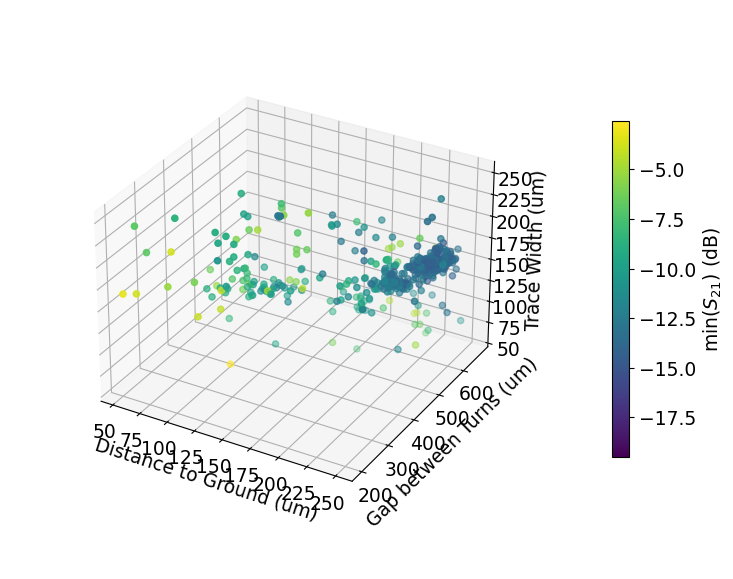

In [353]:
fig = plt.figure(figsize=(9,6))
ax = fig.add_subplot(projection='3d')

ax.scatter(D_gnd*1000, (2*D_gnd+D_gnd0)*1000, W_res_vert*1e3, '.', c=dip)
ax.set_xlabel('Distance to Ground (um)')
ax.set_ylabel('Gap between Turns (um)')
ax.set_zlabel('Trace Width (um)')
ax.set_box_aspect(aspect=None, zoom=0.8)
sm = plt.cm.ScalarMappable(cmap='viridis')
sm.set_array(dip)
cbar = plt.colorbar(sm, ax=ax, pad=0.05, shrink=0.6)
cbar.set_label('$\min(S_{21})$ (dB)')
plt.tight_layout()
plt.show()

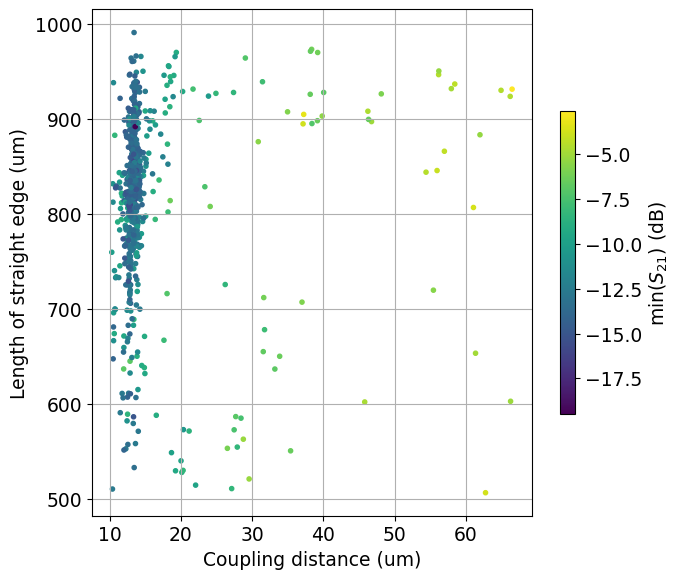

In [354]:
fig = plt.figure(figsize=(7,6))
ax = fig.add_subplot()

ax.scatter(D_couple*1000, L_couple*1000, marker='.', c=dip)
ax.set_xlabel('Coupling distance (um)')
ax.set_ylabel('Length of straight edge (um)')
#ax.set_box_aspect(aspect=None, zoom=0.8)
sm = plt.cm.ScalarMappable(cmap='viridis')
sm.set_array(dip)
cbar = plt.colorbar(sm, ax=ax, pad=0.05, shrink=0.6)
cbar.set_label('$\min(S_{21})$ (dB)')
ax.grid()
plt.tight_layout()
plt.show()

In [355]:
df[df['Cost'] < -19]

,Evaluation,D_couple,D_gnd,D_gnd0,L_extend,W_spiral,Cost
299,300,0.0135373549470998mm,0.238427291851637mm,0.100370012058828mm,0.893699261503918mm,0.16533442183332mm,-19.232
585,586,0.0136131577644224mm,0.233059418728413mm,0.10357093373429mm,0.892224230427999mm,0.163284774781337mm,-19.510


In [41]:
import plotly.graph_objects as go 

def plot_parallel_coord(param_labels, param_values, objective_label, objective_values, 
                        colorscale='thermal', reverse_scale=False, width=1000, height=600):
    param_plot = [dict(label=param_labels[i], values=param_values[i]) for i in range(len(param_values))]
    for d in param_plot:
        d['visible'] = True
    fig = go.Figure(data=
                   go.Parcoords(
                       line=dict(color=objective_values, 
                                 colorscale=colorscale,
                                 colorbar={'title': objective_label},
                                 reversescale=reverse_scale,
                                 showscale=True),
                       dimensions=param_plot
                   ))
    fig.update_layout(width=width, height=height)
    fig.show()

In [357]:
df = pd.read_csv(f'{base}/spiral_v1-1_opt.csv')
D_gnd, D_gnd0, W_res_vert, dip, L_couple, D_couple = remove_mm(df['D_gnd']), remove_mm(df['D_gnd0']), remove_mm(df['W_spiral']), np.array(df['Cost']), remove_mm(df['L_extend']), remove_mm(df['D_couple'])

param_labels = ['Distance to Ground (um)', 'Gap between Turns (um)', 'Trace Width (um)', 'Length of Straight Edge (um)', 'Coupling Distance (um)']
param_values = [D_gnd*1e3, (2*D_gnd+D_gnd0)*1e3, W_res_vert*1e3, L_couple*1e3, D_couple*1e3]
object_values = dip
object_label = 'min(S21) (dB)'
plot_parallel_coord(param_labels, param_values, object_label, object_values, width=750, height=600, colorscale='thermal')

In [358]:
df = pd.read_csv(f'{base}/spiral_v1-1_opt.csv')[df['Cost'] < -15]
D_gnd, D_gnd0, W_res_vert, dip, L_couple, D_couple = remove_mm(df['D_gnd']), remove_mm(df['D_gnd0']), remove_mm(df['W_spiral']), np.array(df['Cost']), remove_mm(df['L_extend']), remove_mm(df['D_couple'])

param_labels = ['Distance to Ground (um)', 'Gap between Turns (um)', 'Trace Width (um)', 'Length of Straight Edge (um)', 'Coupling Distance (um)']
param_values = [D_gnd*1e3, (2*D_gnd+D_gnd0)*1e3, W_res_vert*1e3, L_couple*1e3, D_couple*1e3]
object_values = dip
object_label = 'min(S21) (dB)'
plot_parallel_coord(param_labels, param_values, object_label, object_values, width=750, height=600, colorscale='thermal')

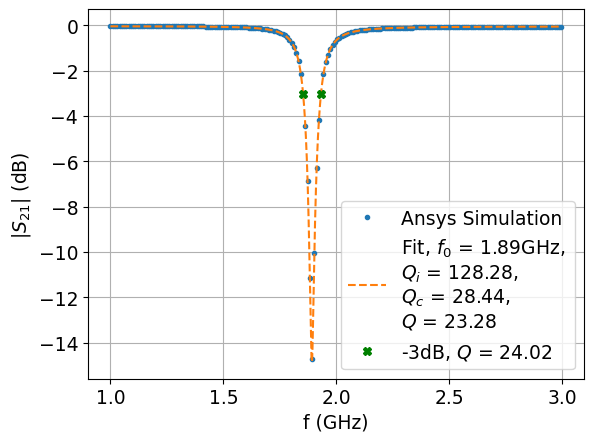

In [457]:
plot_S21('spiral_v1-1-1')

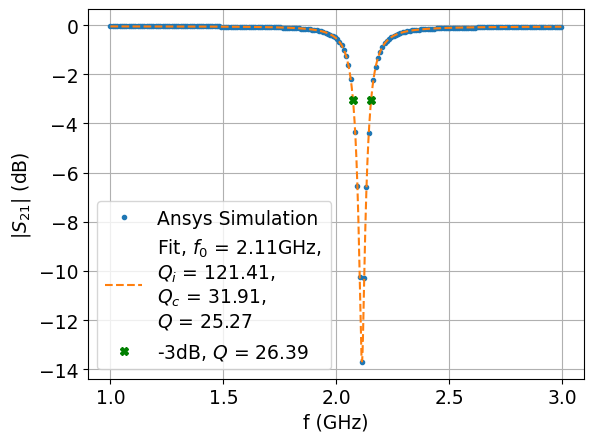

In [458]:
plot_S21('spiral_v1-1-2')

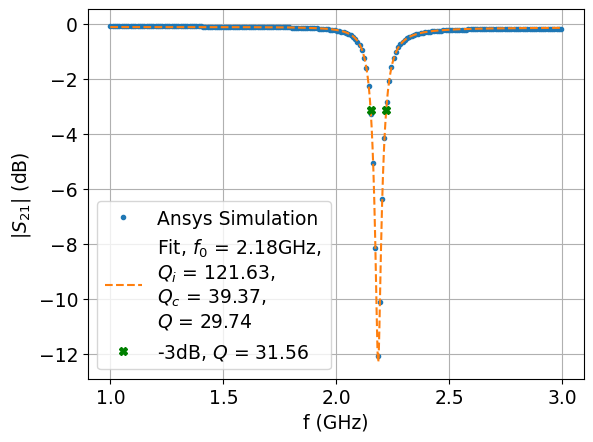

In [459]:
plot_S21('spiral_v1-1-3')

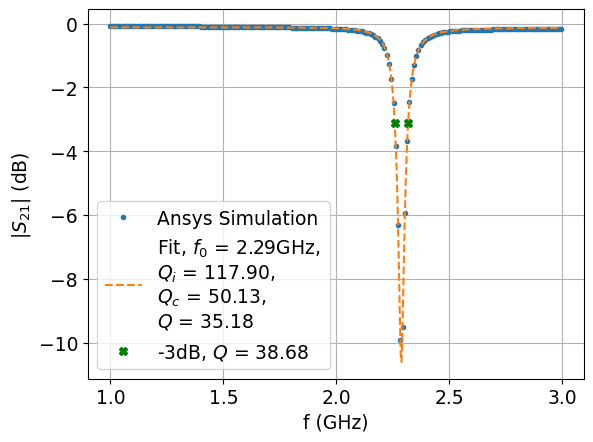

In [460]:
plot_S21('spiral_v1-1-4', f0_guess=2.5)

## Hollow Spiral

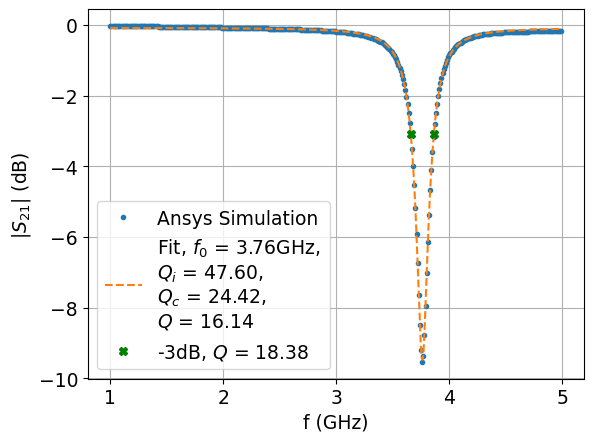

In [461]:
plot_S21('spiral_v2-0', 5, f0_guess=3.5)  # single spiral hollow quarter-wave single-side coupled

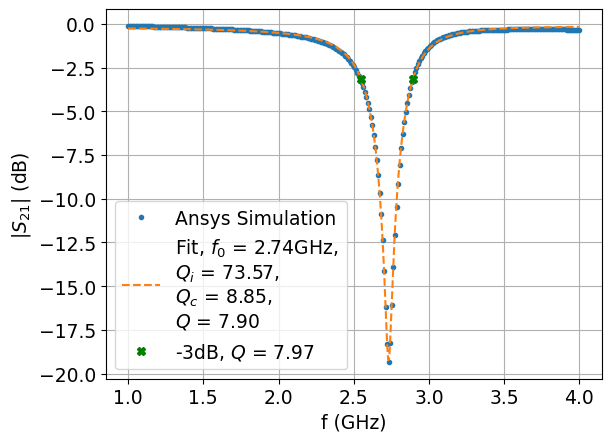

In [462]:
plot_S21('spiral_v2-1', 4, f0_guess=2.5)  # corner-coupled hollow quarter-wave

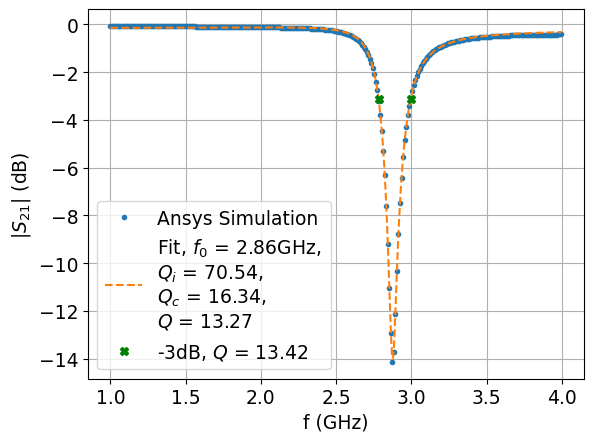

In [463]:
plot_S21('spiral_v2-2', 4, f0_guess=3)  # corner-coupled hollow quarter-wave

## Meander

### Old meander

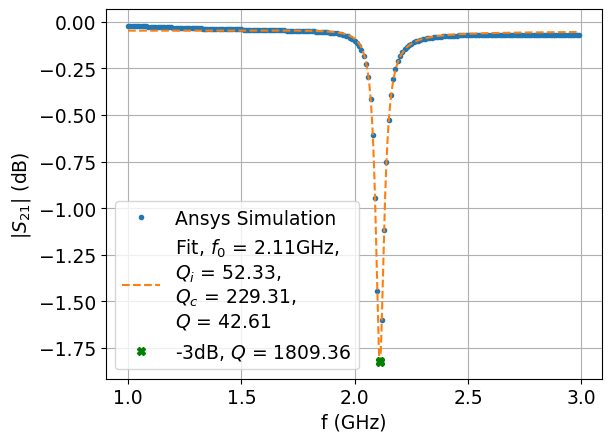

In [468]:
plot_S21('meander_v1-0', 3, f0_guess=2)  # quarter-wave meander, short-side coupled

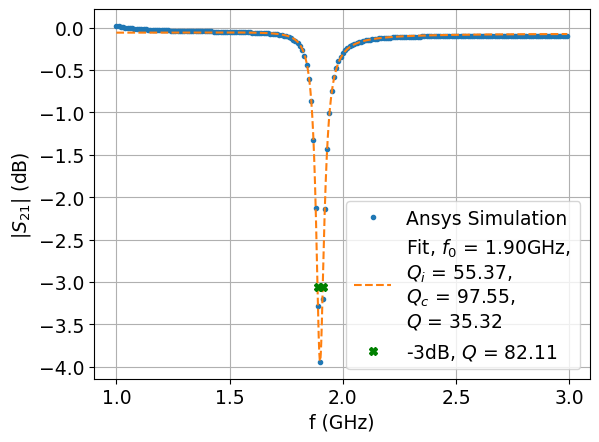

In [471]:
plot_S21('meander_v1-1', 3, f0_guess=2)  # long-end coupled quarter-wave

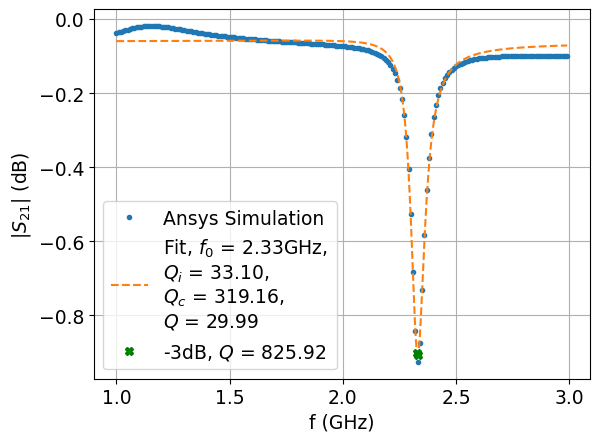

In [472]:
plot_S21('meander_v2-0', 3, f0_guess=2)  # short-end coupled half-wave

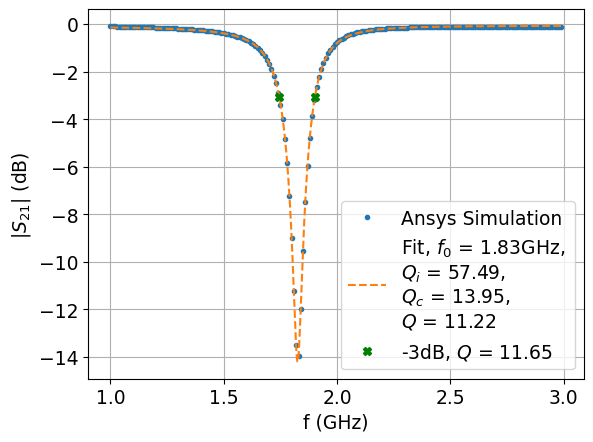

In [474]:
plot_S21('meander_v1-2', 3, f0_guess=2)  # extended-coupled quarter-wave

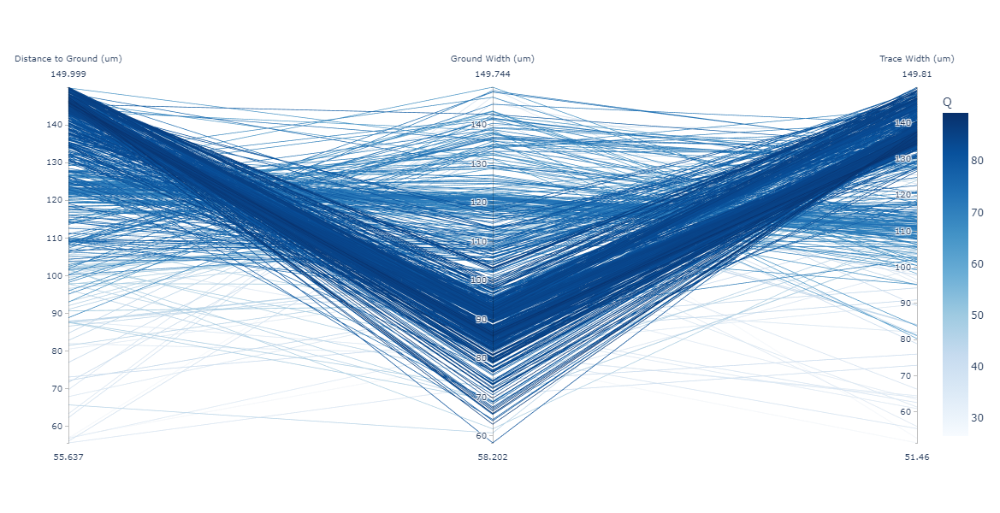

In [539]:
df = pd.read_csv(f'{base}/meander_v1-0_Qi_opt_0.csv')
D_gnd, D_gnd0, W_res_vert, Q = remove_mm(df['D_gnd']), remove_mm(df['D_gnd0']), remove_mm(df['W_res_vert']), -np.array(df['Cost'])

param_labels = ['Distance to Ground (um)', 'Ground Width (um)', 'Trace Width (um)']
param_values = [D_gnd*1e3, D_gnd0*1e3, W_res_vert*1e3]
object_values = Q
object_label = 'Q'
plot_parallel_coord(param_labels, param_values, object_label, object_values, width=750, height=600, colorscale='blues')

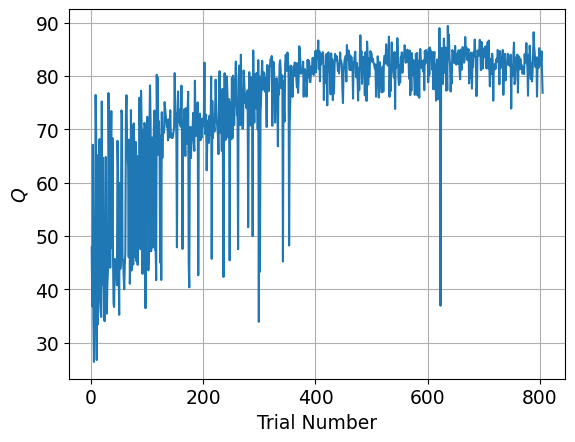

In [499]:
plot(df['Evaluation'], Q, xlabel='Trial Number', ylabel='$Q$')

In [495]:
df[df['Cost'] < -80]

,Evaluation,D_gnd,D_gnd0,W_res_vert,Cost
116,117,0.144528181908702mm,0.11360131585618mm,0.134621168705389mm,-80.226
148,149,0.136259626390516mm,0.106697036285885mm,0.13642253393045mm,-80.542
201,202,0.130873333543344mm,0.0856666098417476mm,0.13395522413897mm,-82.503
228,229,0.140279742913809mm,0.095756944599373mm,0.13997801383863mm,-80.886
237,238,0.135174756034089mm,0.105870854932764mm,0.136861162691666mm,-80.519
...,...,...,...,...,...
799,800,0.14425355506194mm,0.0850636279578163mm,0.137281642642355mm,-81.935
800,801,0.146281126921391mm,0.0877562162222732mm,0.134748517107512mm,-84.281
801,802,0.145773302557618mm,0.086527861148962mm,0.13505866622848mm,-82.366
802,803,0.145615266309262mm,0.076350846899844mm,0.135115237001366mm,-84.621


NOTE: it seems like the length of the vertical line also matters. So potentially, increasing the overlap and distance between turns can actually help, maybe by increasing series capacitance?

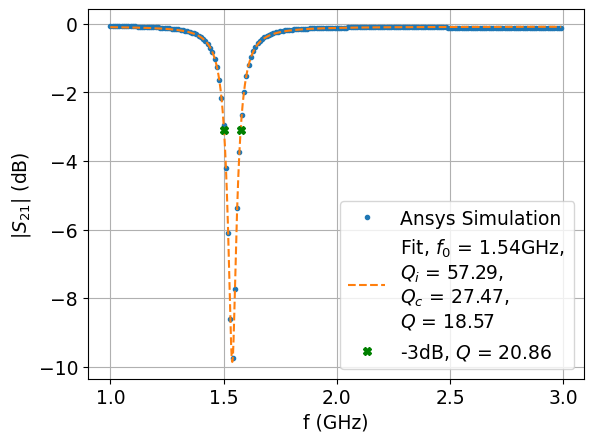

In [487]:
plot_S21('meander_v1-1-2', 3, f0_guess=2)  # long-end coupled quarter-wave, increase long-end length

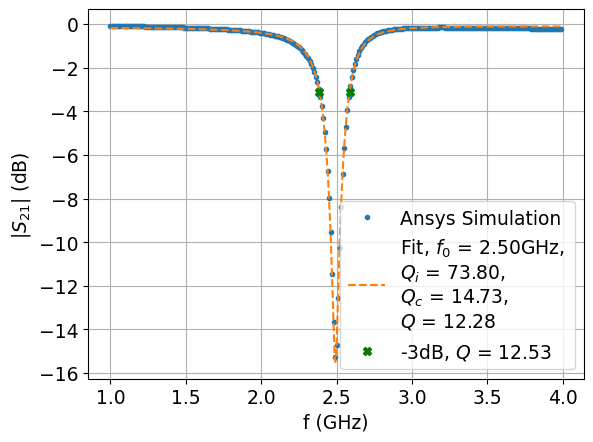

In [490]:
plot_S21('meander_v1-1-3', 4, f0_guess=3)  # long-end coupled quarter-wave, increase long-end length

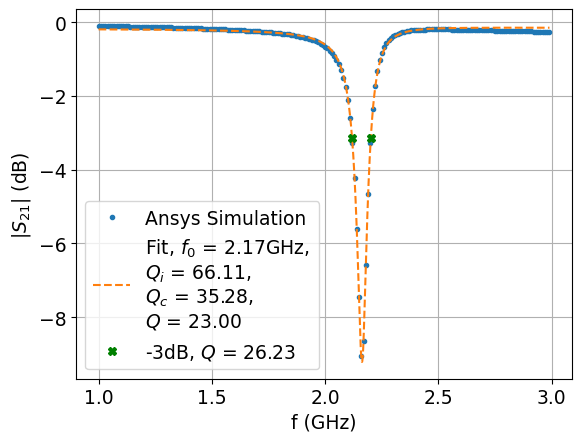

In [498]:
plot_S21('meander_v1-1-4', 3, f0_guess=2)  # long-end coupled quarter-wave, crit. coupled, d=50um

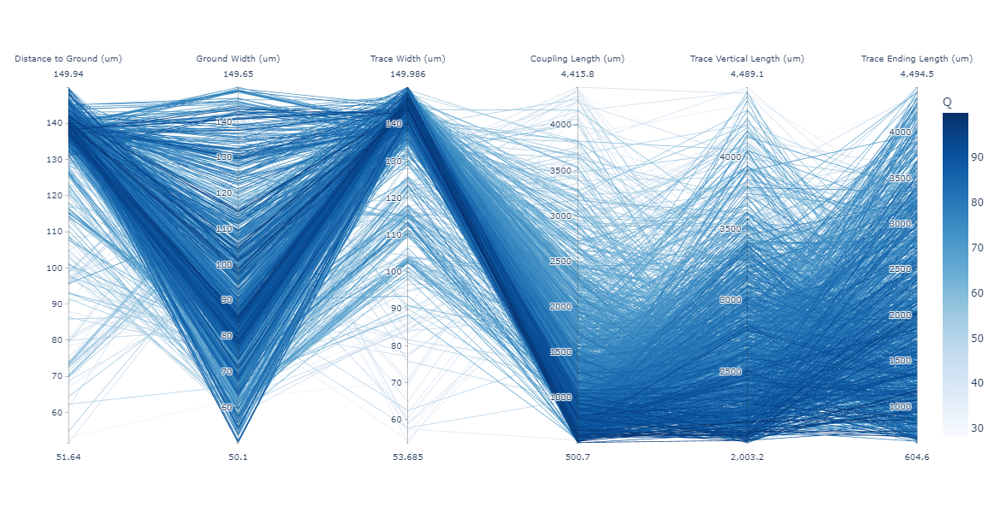

In [42]:
df = pd.read_csv(f'{base}/meander_v1-4_optimization.csv')
D_gnd, D_gnd0 = remove_mm(df['D_gnd']), remove_mm(df['D_gnd0'])
W_res_vert = remove_mm(df['W_res_vert'])
L_couple_len = remove_mm(df['L_res_vert_0'])
L_res_vert, L_res_vert_4 = remove_mm(df['L_res_vert']), remove_mm(df['L_res_vert_4'])
Q = -np.array(df['Cost'])

param_labels = ['Distance to Ground (um)', 'Ground Width (um)', 'Trace Width (um)',
                'Coupling Length (um)', 'Trace Vertical Length (um)', 'Trace Ending Length (um)']
param_values = [D_gnd*1e3, D_gnd0*1e3, W_res_vert*1e3, L_couple_len*1e3, L_res_vert*1e3, L_res_vert_4*1e3]
object_values = Q
object_label = 'Q'
plot_parallel_coord(param_labels, param_values, object_label, object_values, width=750, height=600, colorscale='blues')

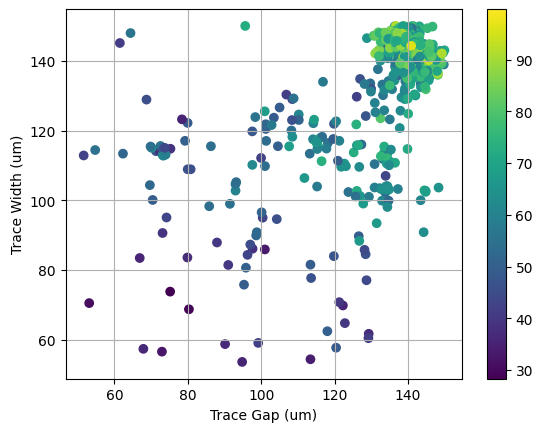

In [46]:
plt.scatter(D_gnd*1e3, W_res_vert*1e3, marker='o', c=Q)
plt.grid() 
plt.xlabel('Trace Gap (um)')
plt.ylabel('Trace Width (um)')
plt.colorbar()

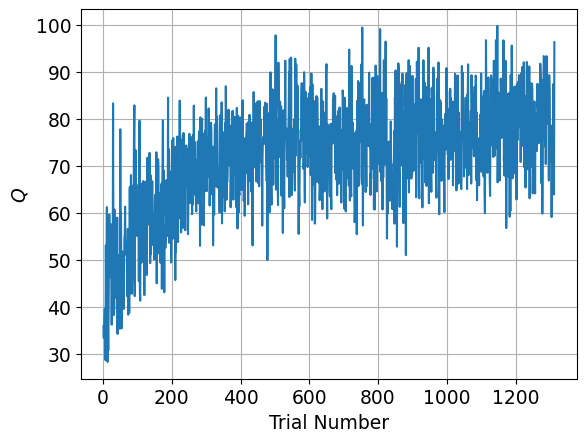

In [502]:
plot(df['Evaluation'], Q, xlabel='Trial Number', ylabel='$Q$')

In [505]:
df[df['Cost'] < -99]

,Evaluation,D_gnd,D_gnd0,L_res_vert,L_res_vert_0,L_res_vert_4,W_res_vert,Cost
753,754,0.140226483962339mm,0.0986233504099437mm,2.14526446348662mm,0.635663797028905mm,1.07024838553189mm,0.143798221648698mm,-99.414
805,806,0.139085785085387mm,0.104309775398598mm,2.08147441646392mm,0.561022941688074mm,0.728772293163472mm,0.148555635593236mm,-99.109
1146,1147,0.141737191776936mm,0.114694919006358mm,2.15573596138233mm,0.524772557380968mm,0.850866502940512mm,0.144644076959752mm,-99.768


In [528]:
v3_1 = df.loc[753]  # appears to be garbage
v3_2 = df.loc[805]  # also appears to be garbage...
v3_3 = df.loc[1146]

In [512]:
v3_2

Evaluation                      806
D_gnd           0.139085785085387mm
D_gnd0          0.104309775398598mm
L_res_vert       2.08147441646392mm
L_res_vert_0    0.561022941688074mm
L_res_vert_4    0.728772293163472mm
W_res_vert      0.148555635593236mm
Cost                        -99.109
Name: 805, dtype: object

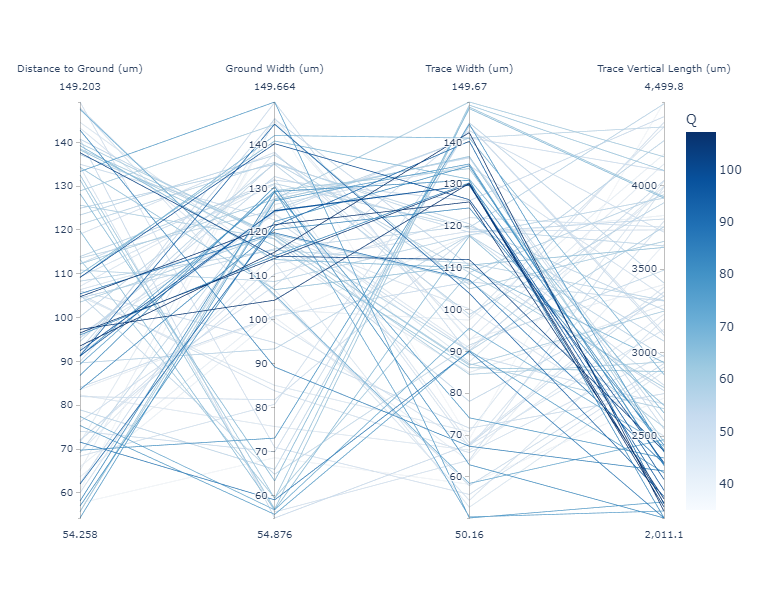

In [541]:
df = pd.read_csv(f'{base}/meander_v3_optimization1.csv')
#df = df[df['Cost'] < -89]
#df = df[df['Cost'] > -92]
D_gnd, D_gnd0 = remove_mm(df['D_gnd']), remove_mm(df['D_gnd0'])
W_res_vert = remove_mm(df['W_res_vert'])
L_res_vert = remove_mm(df['L_res_vert'])
Q = -np.array(df['Cost'])

param_labels = ['Distance to Ground (um)', 'Ground Width (um)', 'Trace Width (um)', 'Trace Vertical Length (um)']
param_values = [D_gnd*1e3, D_gnd0*1e3, W_res_vert*1e3, L_res_vert*1e3]
object_values = Q
object_label = 'Q'
plot_parallel_coord(param_labels, param_values, object_label, object_values, width=750, height=600, colorscale='blues')

In [542]:
df[df['Cost'] < -90]

,Evaluation,D_gnd,D_gnd0,L_res_vert,W_res_vert,Cost
25,26,0.0912274544511246mm,0.124944303720206mm,2.17677846613971mm,0.129757072664571mm,-96.470
46,47,0.0912672459208607mm,0.144625202807873mm,2.14042629260197mm,0.103912685936654mm,-93.903
60,61,0.137631718258377mm,0.114508459941474mm,2.41202996102902mm,0.111968161124316mm,-102.020
66,67,0.0620077147273473mm,0.121396006274163mm,2.09494376647967mm,0.140288775275235mm,-92.330
82,83,0.0965088242499854mm,0.114017032346775mm,2.07684575787058mm,0.130057605760213mm,-104.610
86,87,0.109169171430746mm,0.140169506923969mm,2.34167996384333mm,0.126314280797848mm,-99.028
90,91,0.0924308025193436mm,0.124788830476979mm,2.24207752333003mm,0.129758097367737mm,-96.791
92,93,0.0973071433066819mm,0.104509419871642mm,2.10029727801713mm,0.130216428243131mm,-104.930
94,95,0.0935311418824977mm,0.115470806420556mm,2.05155141892316mm,0.142365884643837mm,-107.140
96,97,0.104753164037116mm,0.121718090790227mm,2.1255471960069mm,0.125774776951789mm,-105.660


In [535]:
v3_4 = df.loc[94]

Evaluation                      95
D_gnd         0.0935311418824977mm
D_gnd0         0.115470806420556mm
L_res_vert      2.05155141892316mm
W_res_vert     0.142365884643837mm
Cost                       -107.14
Name: 94, dtype: object


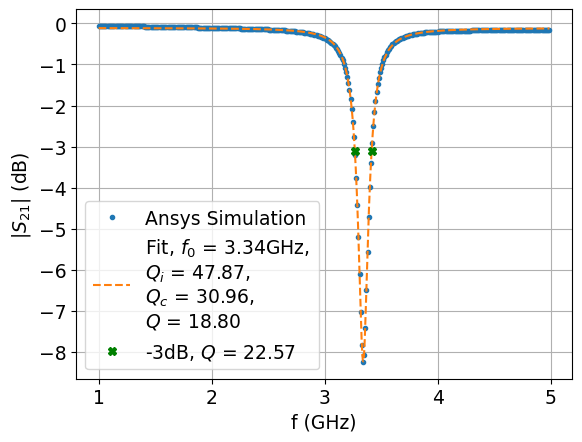

In [538]:
print(v3_4)
plot_S21('meander_v3-4', 5, f0_guess=3)  # long-end coupled quarter-wave, crit. coupled, d=50um

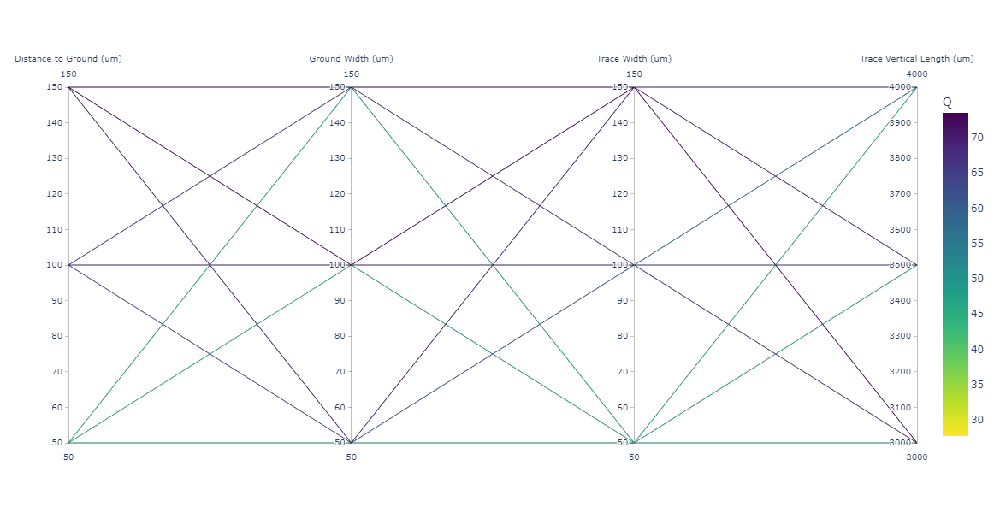

In [554]:
df = pd.read_csv(f'{base}/meander_v3_sweep1.csv')
#df = df[df['Cost'] < -89]
#df = df[df['Cost'] > -92]
D_gnd, D_gnd0 = remove_mm(df['D_gnd']), remove_mm(df['D_gnd0'])
W_res_vert = remove_mm(df['W_res_vert'])
L_res_vert = remove_mm(df['L_res_vert'])
Q = np.array(df['Q(1)'])

param_labels = ['Distance to Ground (um)', 'Ground Width (um)', 'Trace Width (um)', 'Trace Vertical Length (um)']
param_values = [D_gnd*1e3, D_gnd0*1e3, W_res_vert*1e3, L_res_vert*1e3]
object_values = Q
object_label = 'Q'
plot_parallel_coord(param_labels, param_values, object_label, object_values, width=750, height=600, colorscale='viridis_r')

Variation            18
D_gnd            0.15mm
D_gnd0            0.1mm
L_res_vert          3mm
W_res_vert       0.15mm
Q(1)          73.484866
Name: 17, dtype: object


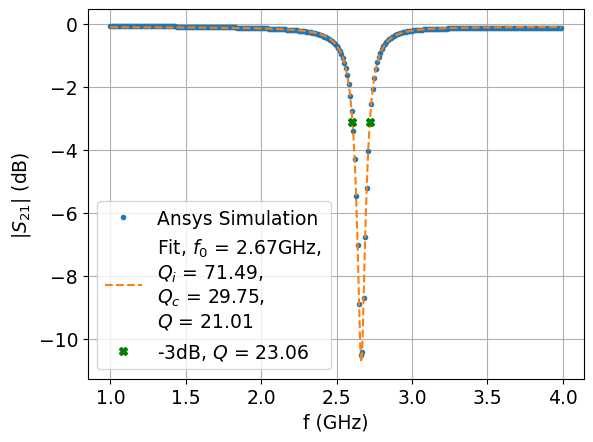

In [559]:
df = pd.read_csv(f'{base}/meander_v3_sweep1.csv')
df = df[df['Q(1)'] > 70]
v3_5 = df.loc[17]
print(v3_5)
plot_S21('meander_v3-5', 4, f0_guess=2.5)

    Variation   D_gnd  D_gnd0 L_res_vert W_res_vert       Q(1)
8           9  0.15mm  0.05mm        3mm     0.15mm  70.234629
17         18  0.15mm   0.1mm        3mm     0.15mm  73.484866
26         27  0.15mm  0.15mm        3mm     0.15mm  72.213064
44         45  0.15mm   0.1mm      3.5mm     0.15mm  70.292459


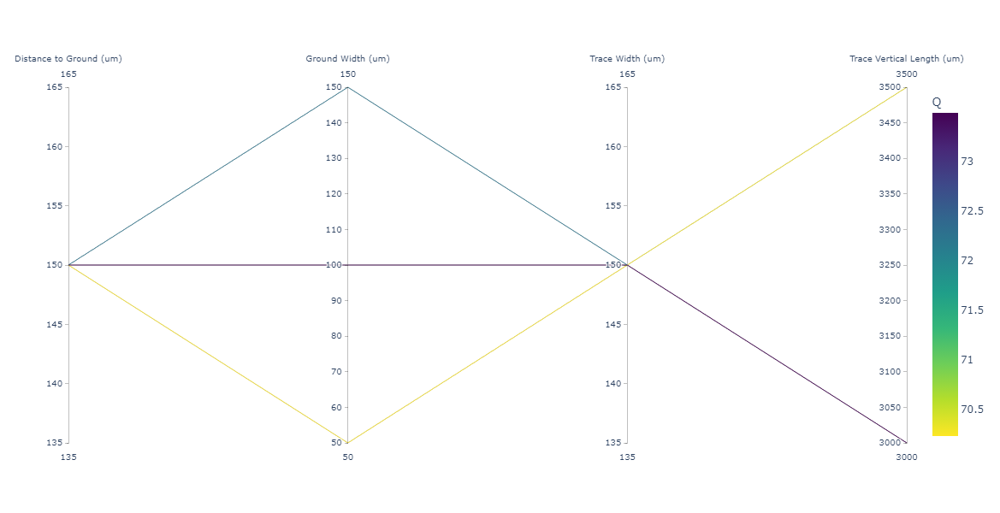

In [558]:
df = pd.read_csv(f'{base}/meander_v3_sweep1.csv')
df = df[df['Q(1)'] > 70]
print(df)
D_gnd, D_gnd0 = remove_mm(df['D_gnd']), remove_mm(df['D_gnd0'])
W_res_vert = remove_mm(df['W_res_vert'])
L_res_vert = remove_mm(df['L_res_vert'])
Q = np.array(df['Q(1)'])

param_labels = ['Distance to Ground (um)', 'Ground Width (um)', 'Trace Width (um)', 'Trace Vertical Length (um)']
param_values = [D_gnd*1e3, D_gnd0*1e3, W_res_vert*1e3, L_res_vert*1e3]
object_values = Q
object_label = 'Q'
plot_parallel_coord(param_labels, param_values, object_label, object_values, width=750, height=600, colorscale='viridis_r')

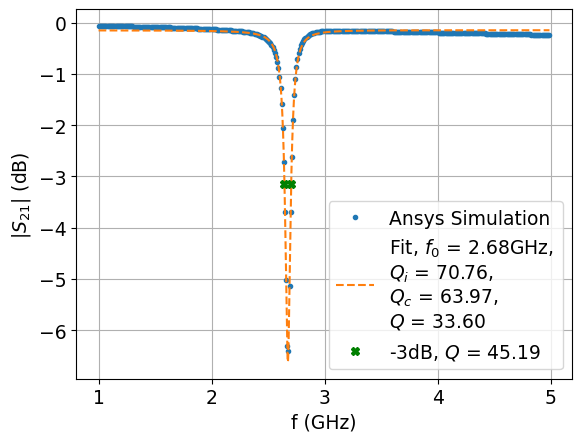

In [562]:
# long-end coupled quarter-wave, crit. coupled, d=30um, L_all=3mm
plot_S21('meander_v3-6', 5, f0_guess=3) 

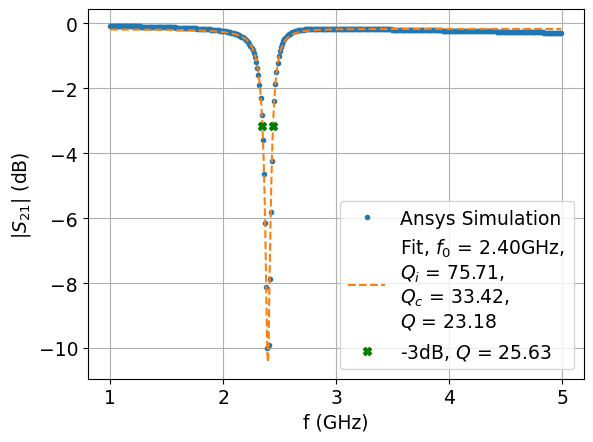

In [572]:
# long-end coupled quarter-wave, d=30um, L_all=3mm, L_couple=4.5mm
# D_gnd=0.15mm, D_gnd0=0.1mm
plot_S21('meander_v3-7', 5, f0_guess=3) 

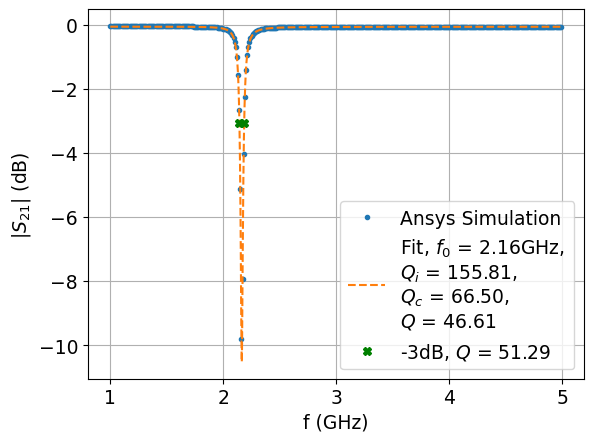

In [584]:
# long-end coupled quarter-wave, d=60um, L_all=3mm, L_couple=3.8mm, L_end=3.8mm
# D_gnd=0.35mm, D_gnd0=0.1mm, W_trace=0.35mm
plot_S21('meander_v3-8', 5, f0_guess=3) 

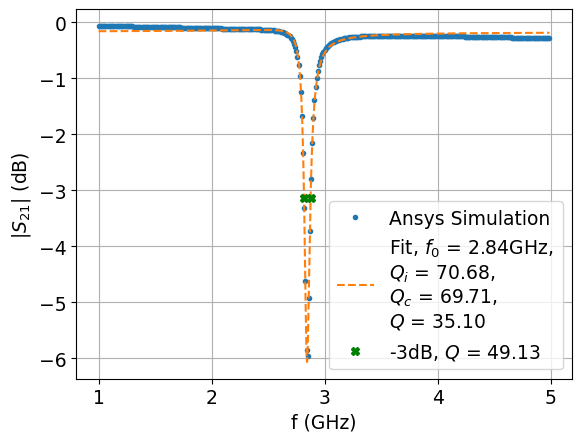

In [573]:
plot_S21('meander_v4-0', 5, f0_guess=3) 

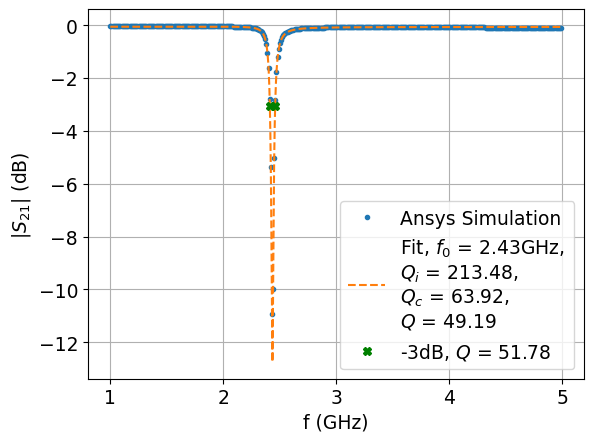

In [589]:
plot_S21('meander_v5-1', 5, f0_guess=2.5) 

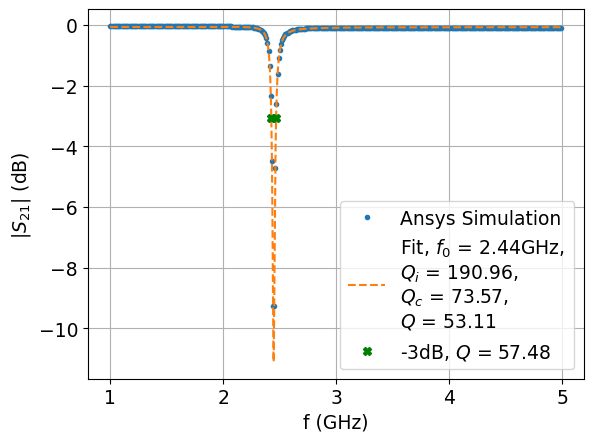

In [590]:
plot_S21('meander_v5-2', 5, f0_guess=2.5) 

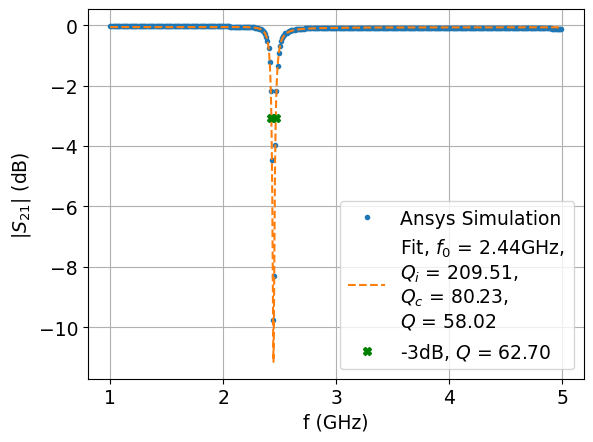

In [591]:
plot_S21('meander_v5-3', 5, f0_guess=2.5) 

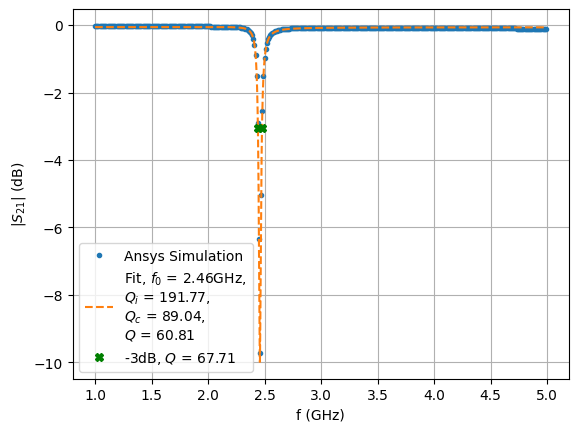

In [5]:
# long-end coupled quarter-wave, d=50um, L_all=3mm, L_couple=3.8mm, L_end=3.8mm
# D_gnd=0.35mm, D_gnd0=0.1mm, W_trace=0.35mm, trench depth=500um
plot_S21('meander_v5-4', 5, f0_guess=2.5) 

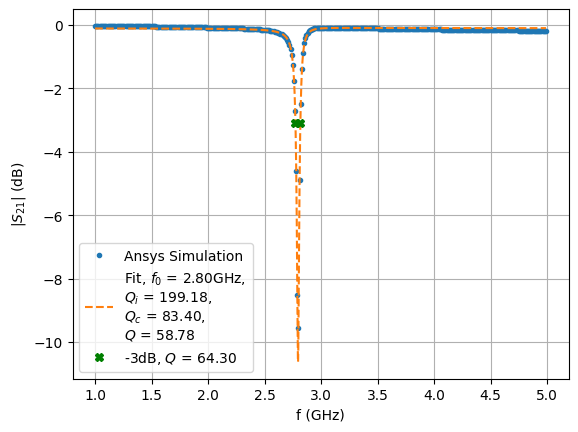

In [54]:
# long-end coupled quarter-wave, d=150um, L_all=3mm, L_couple=3.8mm, L_end=3.8mm
# D_gnd=0.35mm, D_gnd0=0.2mm, W_trace=0.35mm, trench depth=500um
plot_S21('meander_v6-0', 5, f0_guess=2.5) 

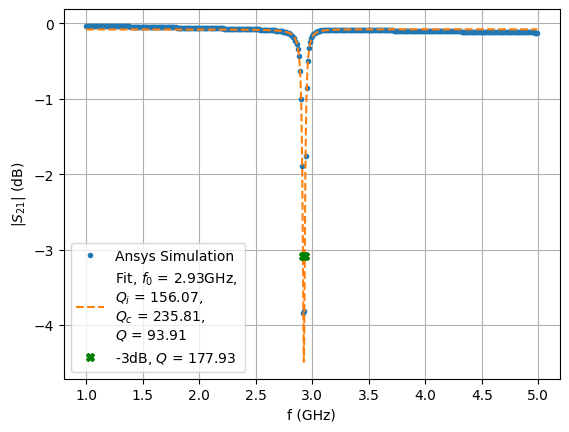

In [99]:
# long-end coupled quarter-wave, d=150um, L_all=3mm, L_couple=3.8mm, L_end=3.8mm
# D_gnd=0.35mm, D_gnd0=0.2mm, W_trace=0.35mm, trench depth=500um
plot_S21('meander_v6-1', 5, f0_guess=2.5) 

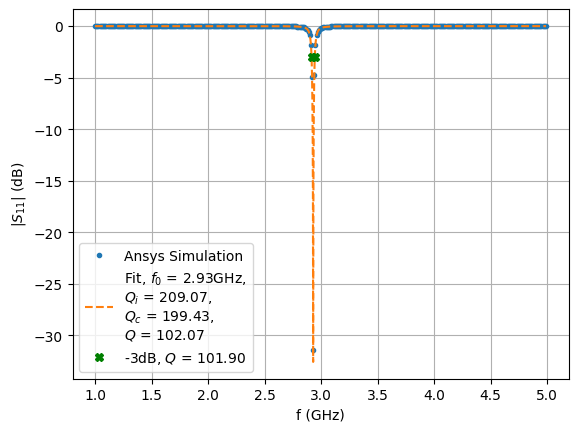

In [100]:
plot_S11('meander_v8-0', 5, f0_guess=3) 

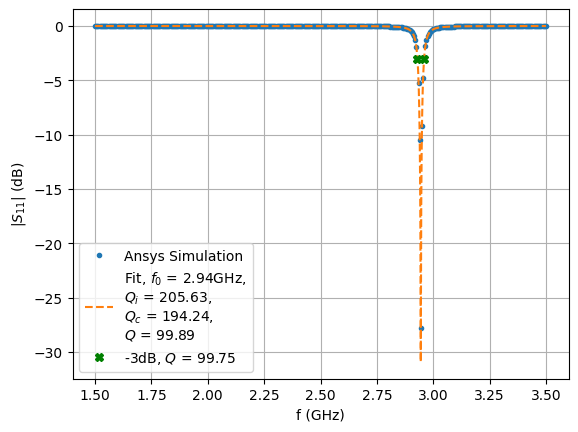

In [31]:
plot_S11('meander_v8-0L', 5, f0_guess=3) 

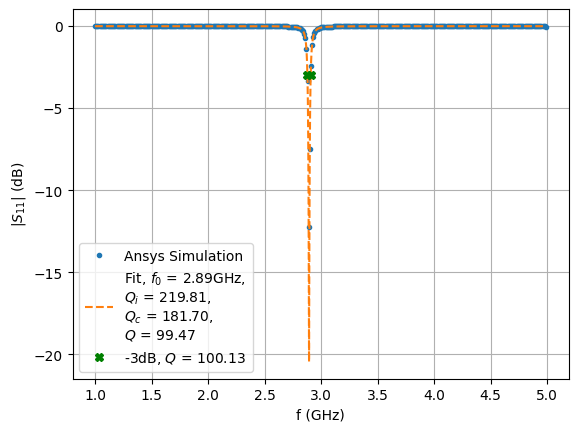

In [168]:
plot_S11('meander_v8-1', 5, f0_guess=3) 

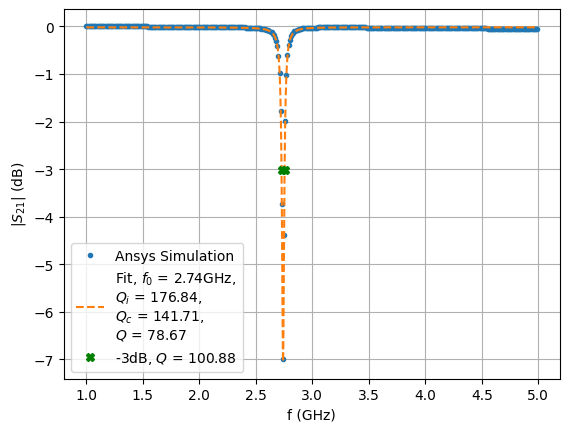

In [13]:
plot_S21('meander_v9', 5, f0_guess=2.5) 

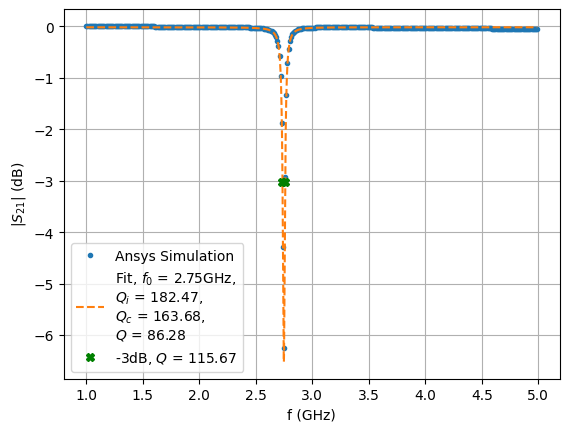

In [20]:
plot_S21('meander_v9-1', 5, f0_guess=2.5) 

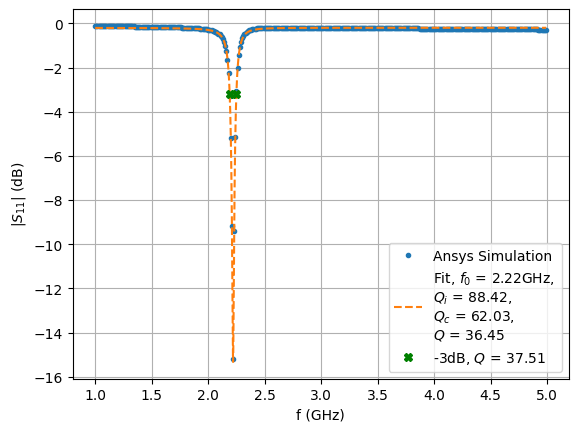

In [50]:
plot_S11('meander_v9L1', 5, f0_guess=2.2) # d = 0.22mm

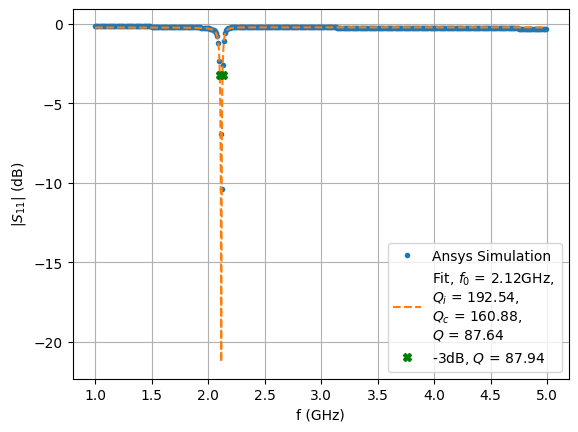

In [51]:
plot_S11('meander_v9L2', 5, f0_guess=2.2) # d = 0.02mm

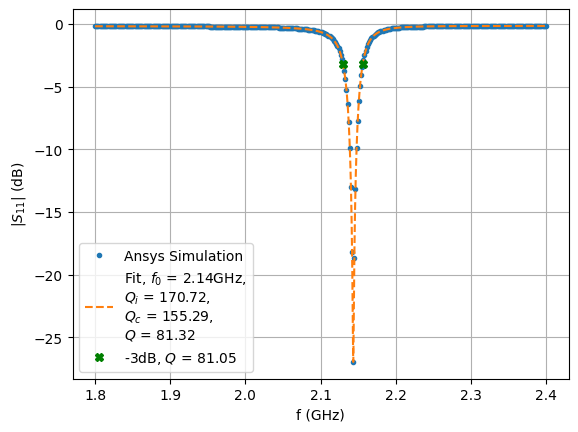

In [54]:
plot_S11('meander_v9L3', 5, f0_guess=2.2) # d = 0.23mm, integrated potential of -18.0372447916663V

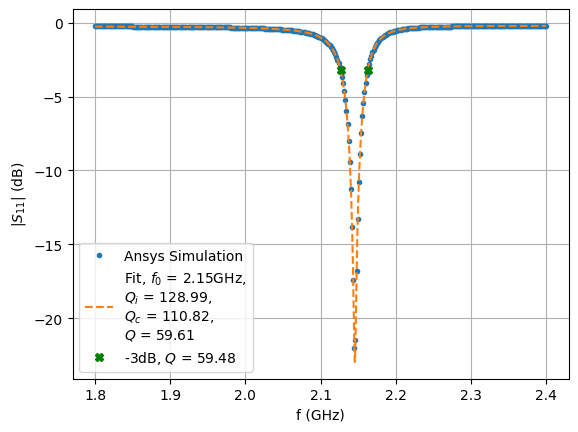

In [56]:
plot_S11('meander_v9L5', 5, f0_guess=2.2) # d = 0.23mm, changed feedline length, L_sub = 7mm

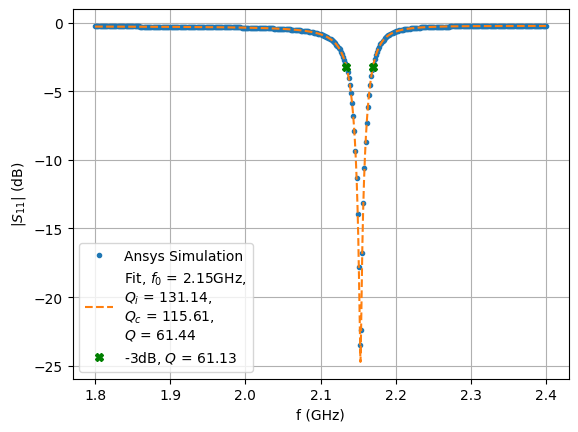

In [57]:
plot_S11('meander_v9L5-1', 5, f0_guess=2.2) # d = 0.23mm, changed feedline length, L_sub = 8mm

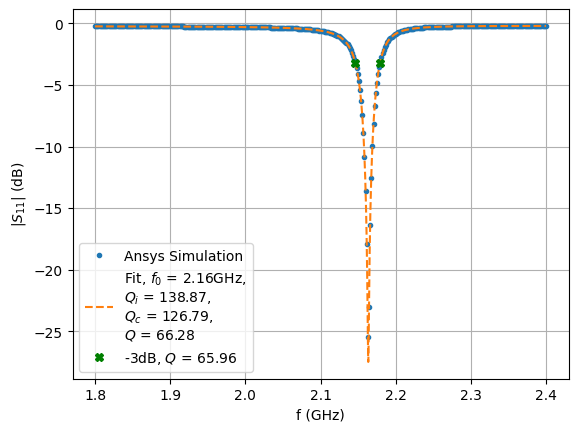

In [59]:
plot_S11('meander_v9L5-2', 5, f0_guess=2.2) # d = 0.23mm, changed feedline length, L_sub = 6.3mm, potential = -16.9217124330751V

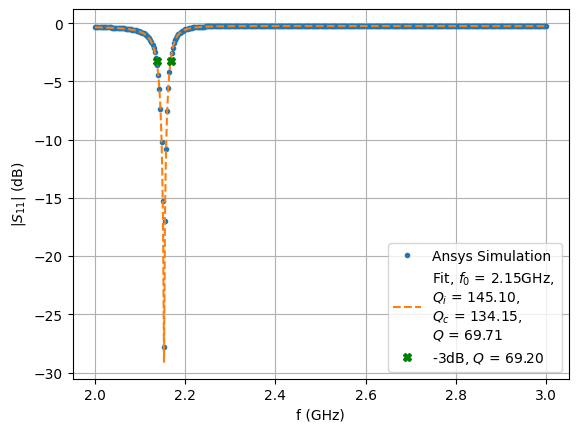

In [116]:
plot_S11('meander_v9L5-3', 5, f0_guess=2.2) # d = 0.23mm, changed feedline length, L_sub = 6.3mm, potential = -16.3635963645853V

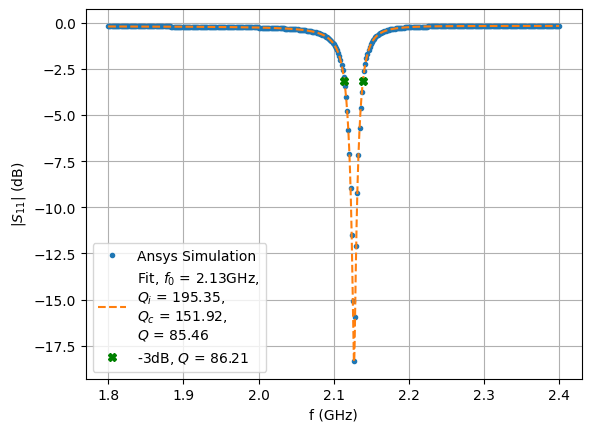

In [53]:
plot_S11('meander_v9L4', 5, f0_guess=2.2) # d = 0.23mm

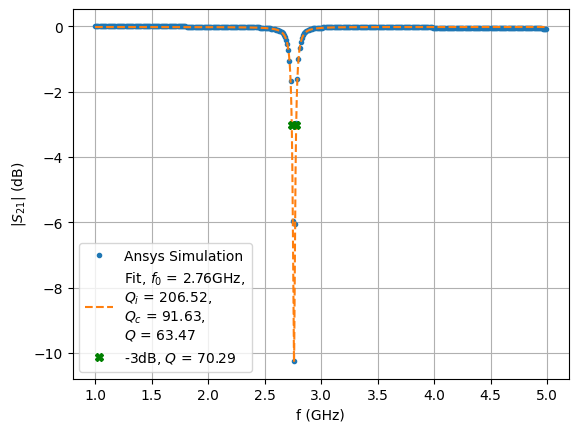

In [19]:
plot_S21('meander_v9-2', 5, f0_guess=2.5) 

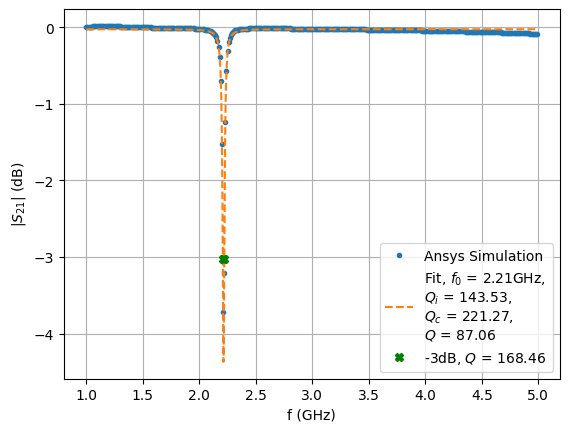

In [29]:
plot_S21('meander_v9-2L', 5, f0_guess=2) 

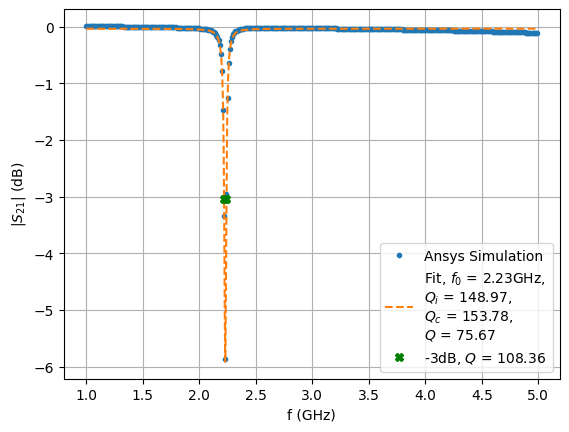

In [28]:
plot_S21('meander_v9-3L', 5, f0_guess=2) 

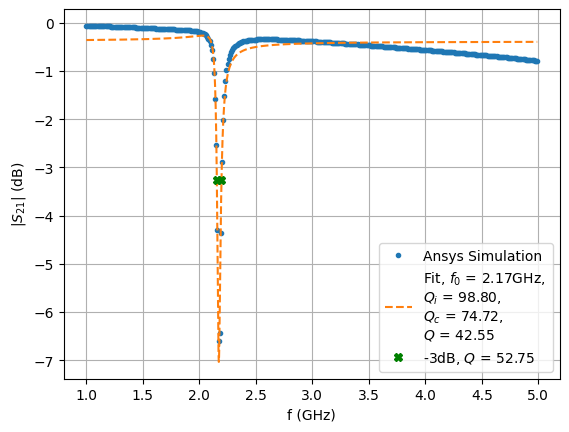

In [40]:
plot_S21('meander_v10L', 5, f0_guess=2.2) 

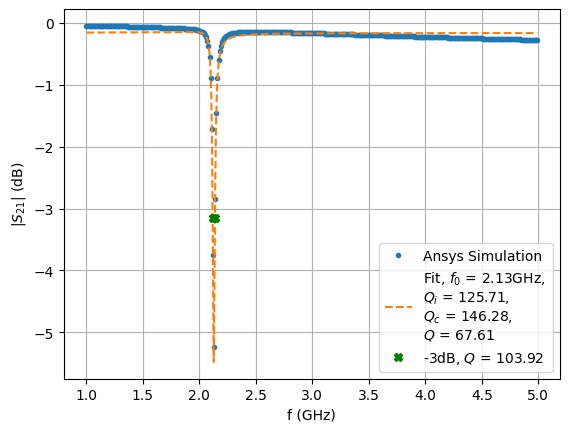

In [39]:
plot_S21('meander_v10L-1', 5, f0_guess=2.2) 

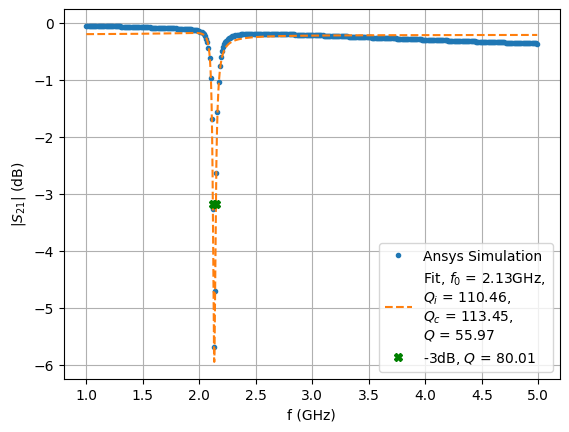

In [41]:
plot_S21('meander_v10L-2', 5, f0_guess=2.2) 

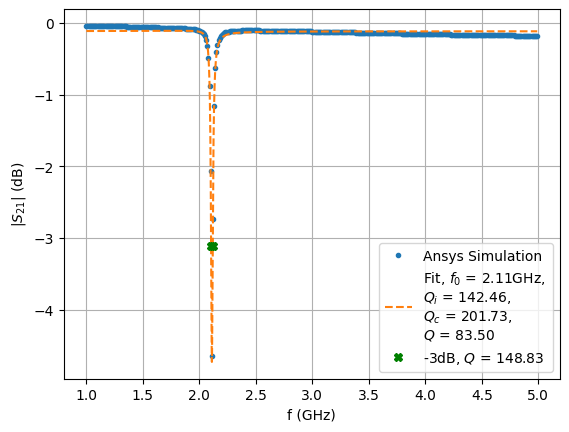

In [42]:
plot_S21('meander_v10L-3', 5, f0_guess=2.2) 

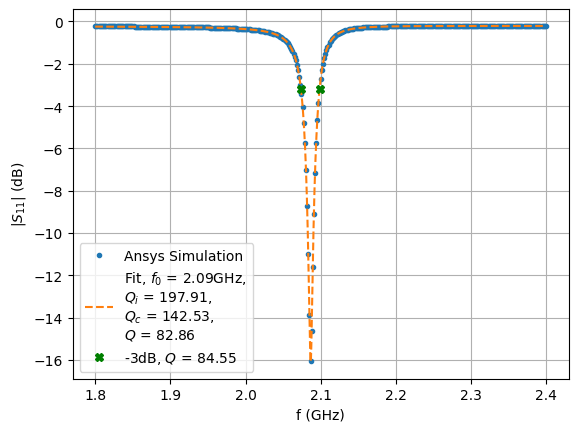

In [71]:
plot_S11('meander_v11L', 5, f0_guess=2.1) 

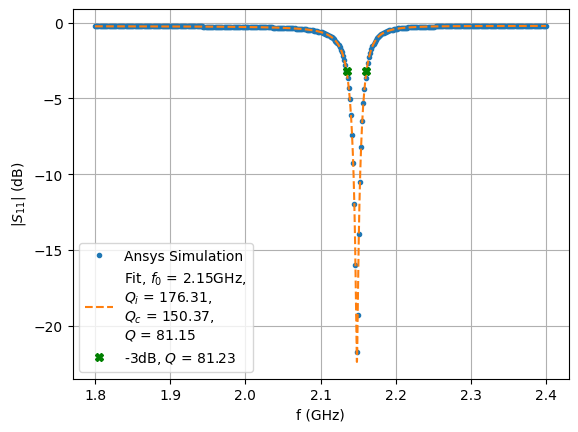

In [72]:
plot_S11('meander_v11L-1', 3, f0_guess=2.1) 

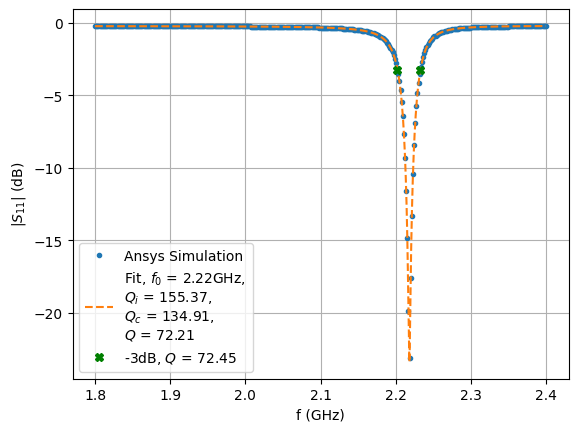

In [73]:
plot_S11('meander_v11L-2', 3, f0_guess=2.1) 

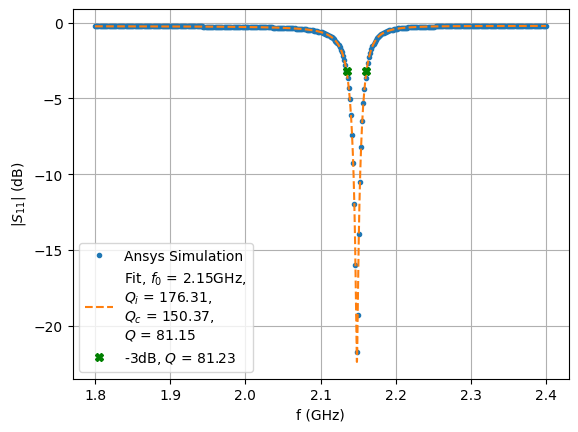

In [77]:
plot_S11('meander_v11L-3', 3, f0_guess=2.1)  # -17.4791790685969V

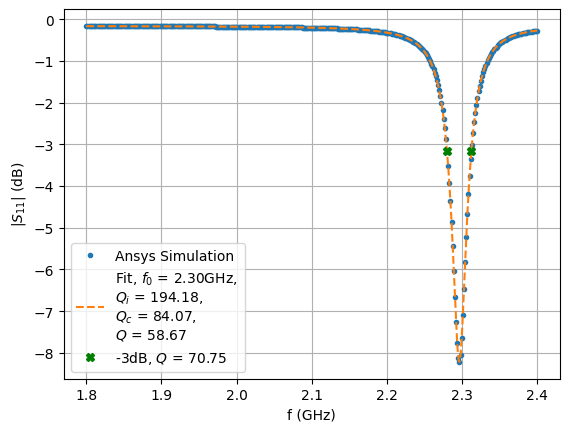

In [80]:
plot_S11('meander_v12L', 3, f0_guess=2.3) # d = 0.3mm

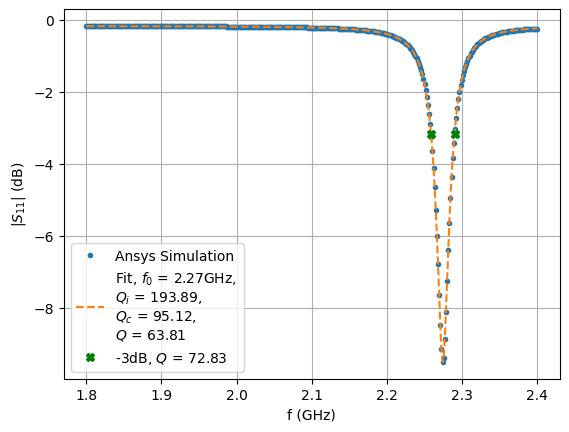

In [81]:
plot_S11('meander_v12L-1', 3, f0_guess=2.3) # d = 0.384mm

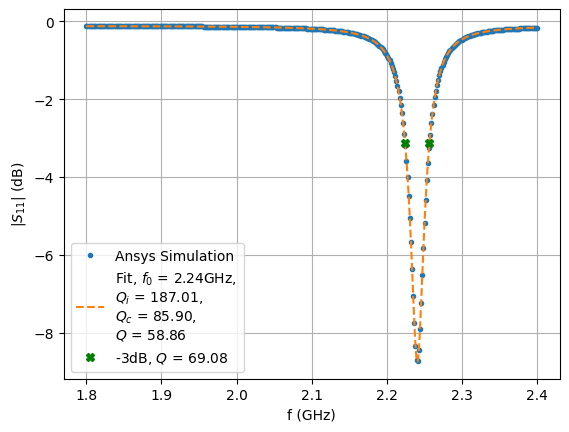

In [89]:
plot_S11('meander_v12L-2', 3, f0_guess=2.2) # d = 0.384mm

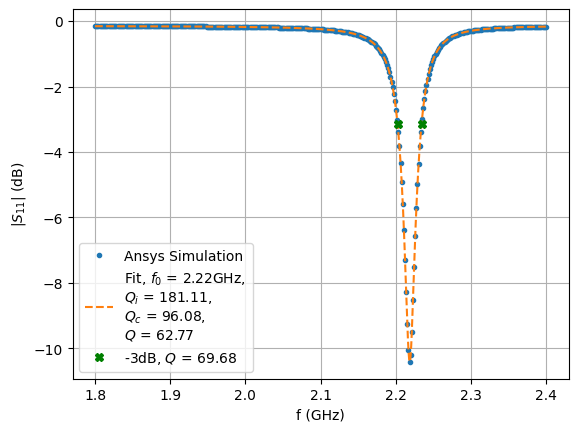

In [90]:
plot_S11('meander_v12L-3', 3, f0_guess=2.2) # d = 0.384mm

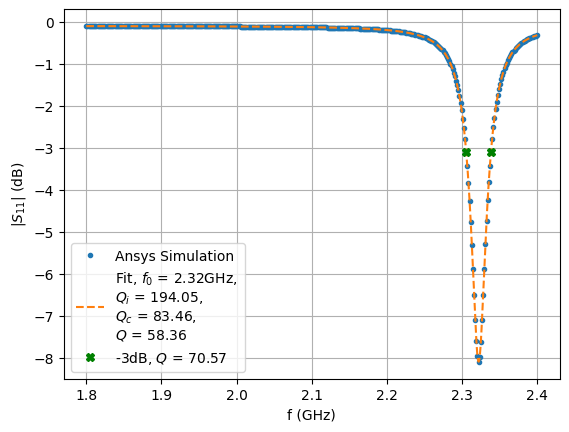

In [92]:
plot_S11('meander_v12L-4', 3, f0_guess=2.3) # d = 0.384mm

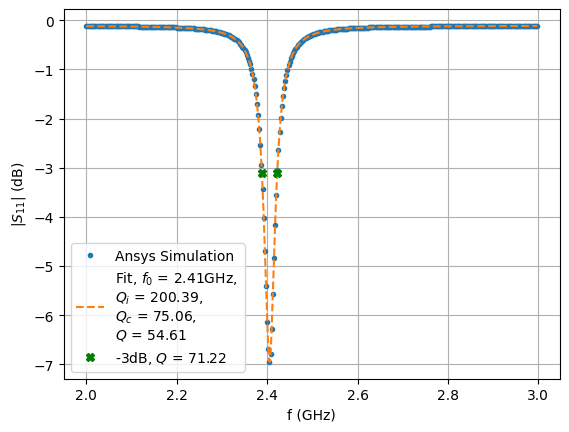

In [93]:
plot_S11('meander_v12L-5', 3, f0_guess=2.4) # d = 0.384mm

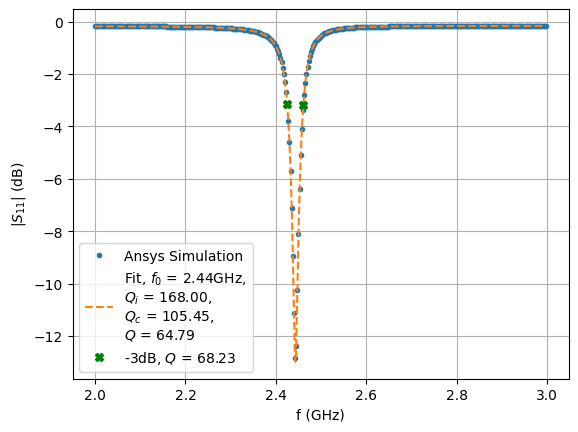

In [94]:
plot_S11('meander_v12L-6', 3, f0_guess=2.4) # d = 0.384mm

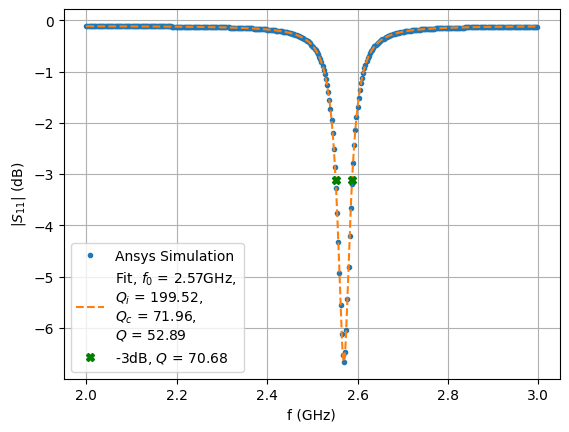

In [95]:
plot_S11('meander_v12L-7', 3, f0_guess=2.4) # d = 0.384mm

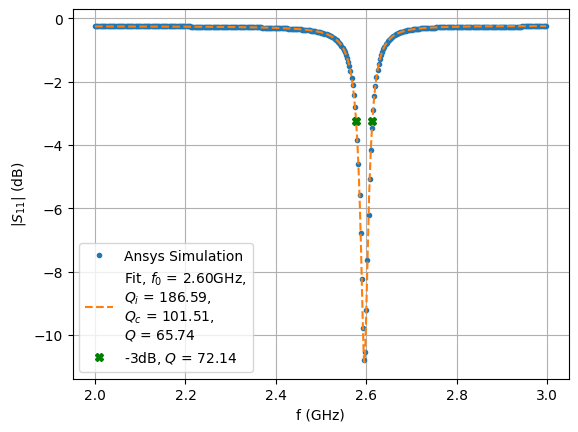

In [97]:
plot_S11('meander_v12L-8', 3, f0_guess=2.6) # d = 0.384mm

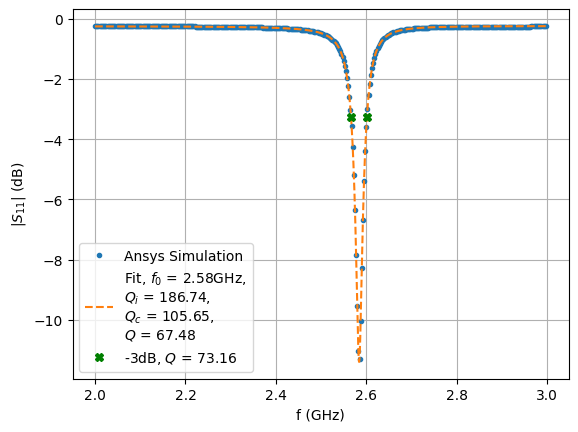

In [98]:
plot_S11('meander_v12L-9', 3, f0_guess=2.6) # d = 0.384mm

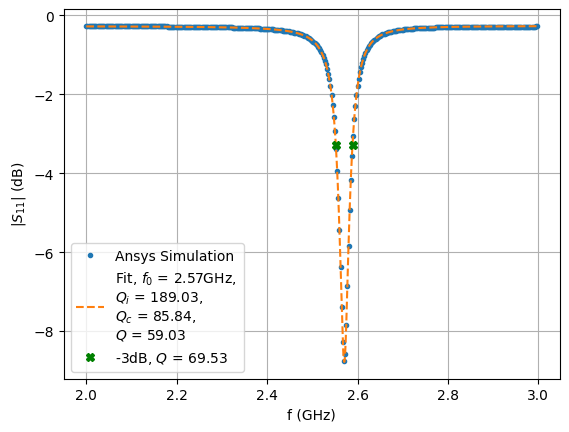

In [99]:
plot_S11('meander_v12L-10', 3, f0_guess=2.6) # d = 0.384mm

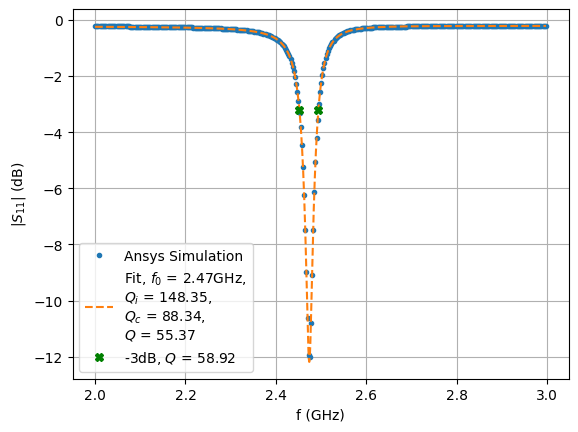

In [102]:
plot_S11('meander_v9L6-0', 3, f0_guess=2.5) # d = 0.22mm

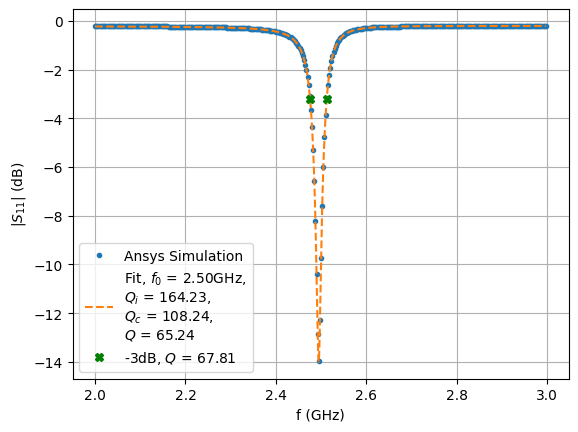

In [103]:
plot_S11('meander_v9L6-1', 3, f0_guess=2.5) # d = 0.33mm

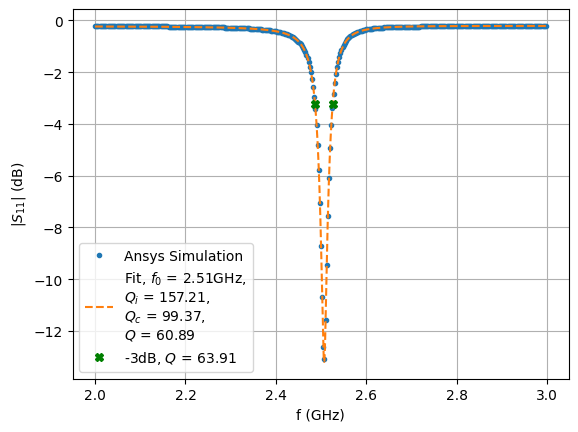

In [105]:
plot_S11('meander_v9L6-2', 3, f0_guess=2.5) # d = 0.34mm, Lc = 3.3mm

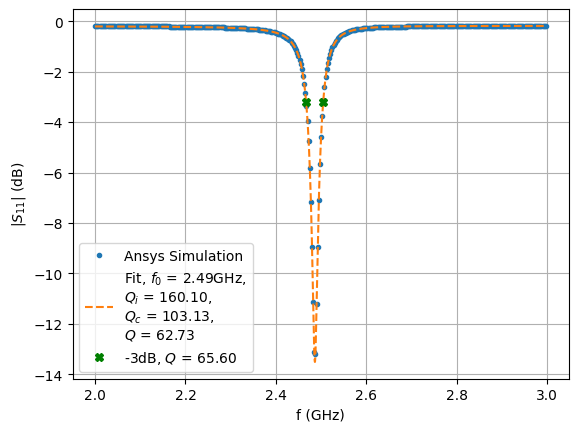

In [106]:
plot_S11('meander_v9L6-3', 3, f0_guess=2.5) # d = 0.34mm, Lc = 2.8mm

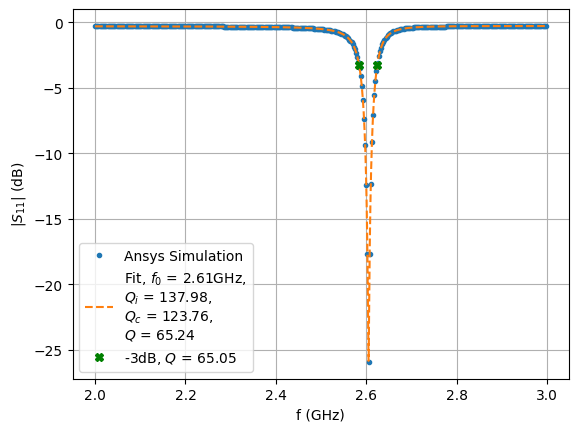

In [107]:
plot_S11('meander_v9L6-4', 3, f0_guess=2.5) # d = 0.34mm, Lc = 2mm

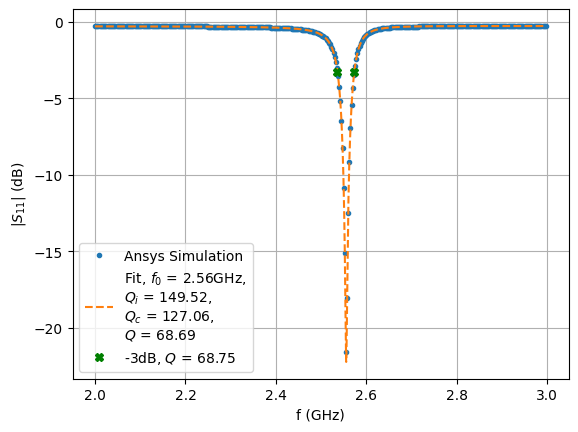

In [108]:
plot_S11('meander_v9L6-5', 3, f0_guess=2.5) # d = 0.34mm, Lc = 2mm

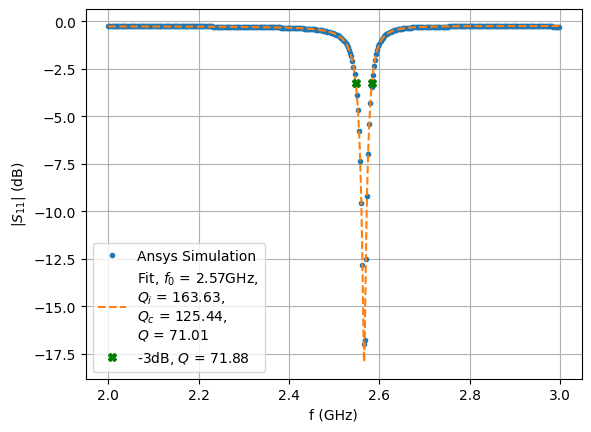

In [109]:
plot_S11('meander_v9L6-6', 3, f0_guess=2.5) # d = 0.34mm, Lc = 2mm

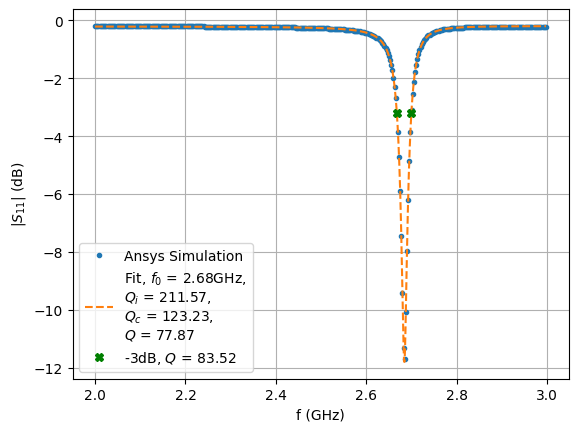

In [111]:
plot_S11('meander_v9L6-7', 3, f0_guess=2.6) # d = 0.34mm, Lc = 2mm

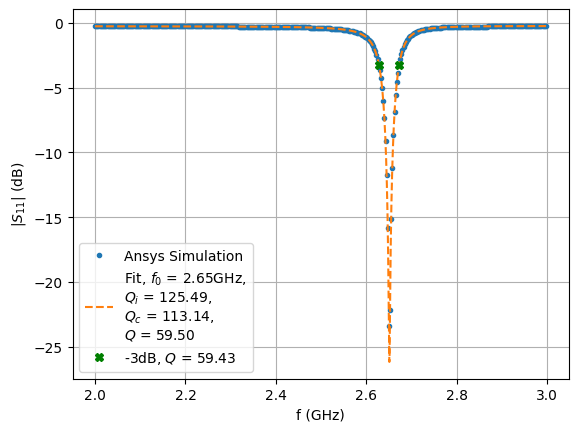

In [112]:
plot_S11('meander_v9L6-8', 3, f0_guess=2.6) # d = 0.34mm, Lc = 2mm

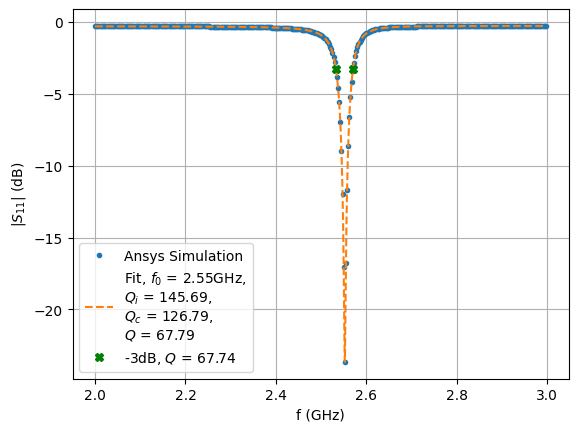

In [114]:
plot_S11('meander_v9L6-9', 3, f0_guess=2.6) # d = 0.34mm, Lc = 2mm, -14.9418807134728V

### Proper fabrication dimensions

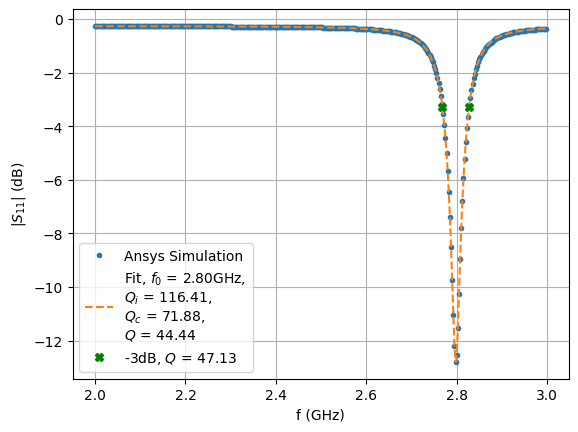

In [10]:
plot_S11('meander_v13', 3, f0_guess=2.8)

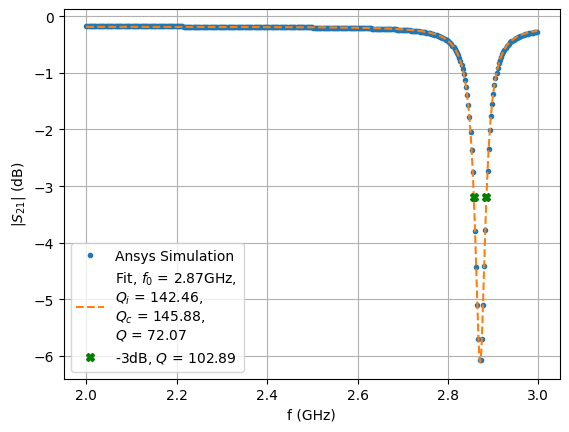

In [15]:
plot_S21('meander_v15-1', 3, f0_guess=2.8)

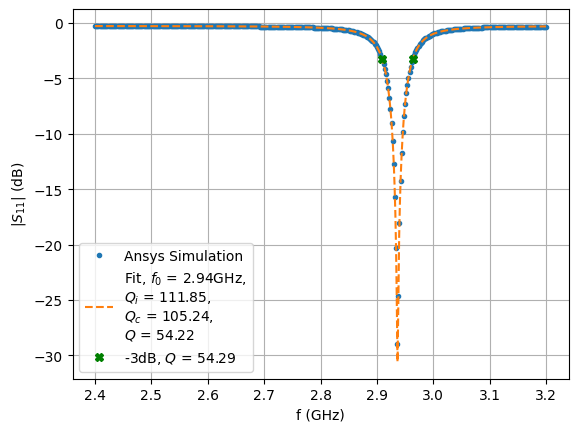

In [20]:
plot_S11('meander_v16', 4, f0_guess=2.9)

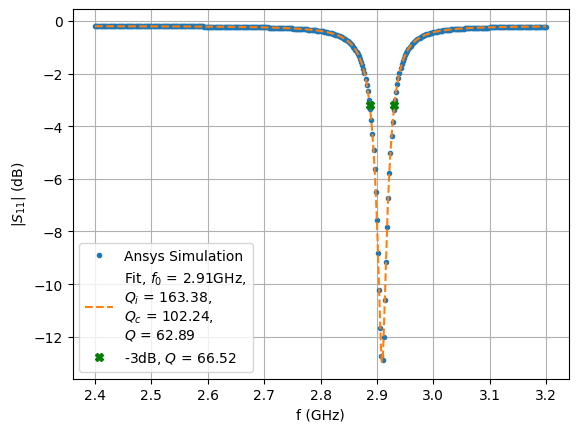

In [25]:
plot_S11('meander_v17', 4, f0_guess=2.9)

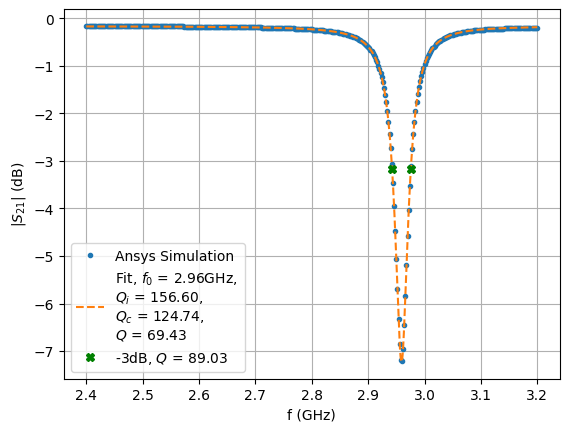

In [78]:
plot_S21('meander_v17-1', 4, f0_guess=2.9)

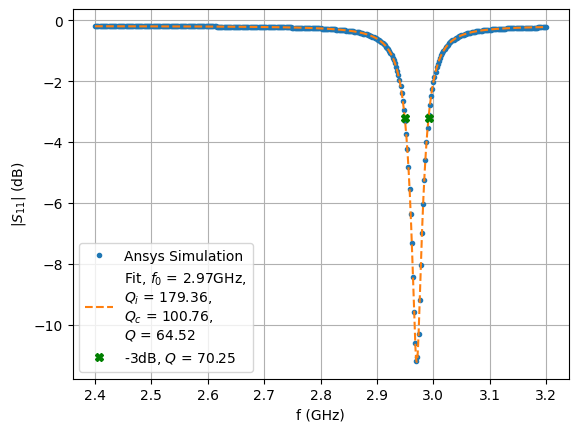

In [79]:
plot_S11('meander_v17-2', 4, f0_guess=2.9)

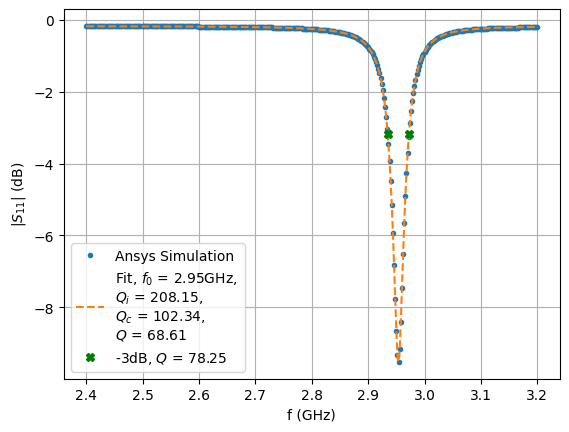

In [33]:
plot_S11('meander_v17-3', 4, f0_guess=2.9)

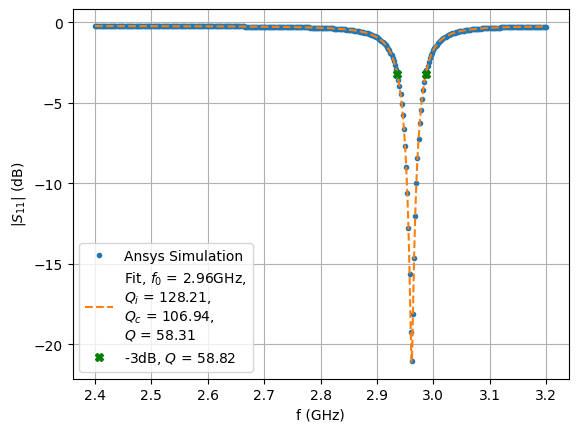

In [31]:
plot_S11('meander_v17-4', 4, f0_guess=2.9)

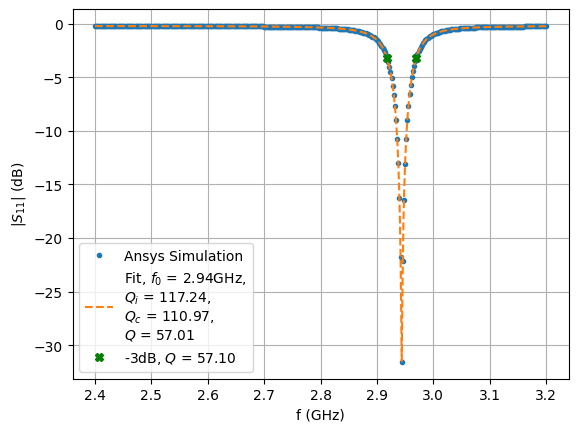

In [37]:
plot_S11('meander_v17-6', 4, f0_guess=2.9) # L_feedline = 3.2mm

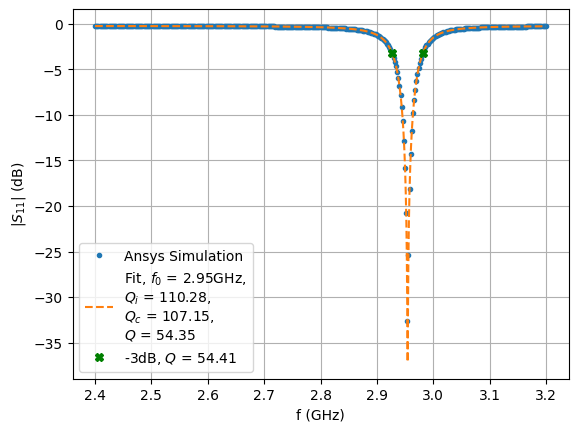

In [39]:
plot_S11('meander_v17-7', 4, f0_guess=2.9) # L_feedline = 3.4mm

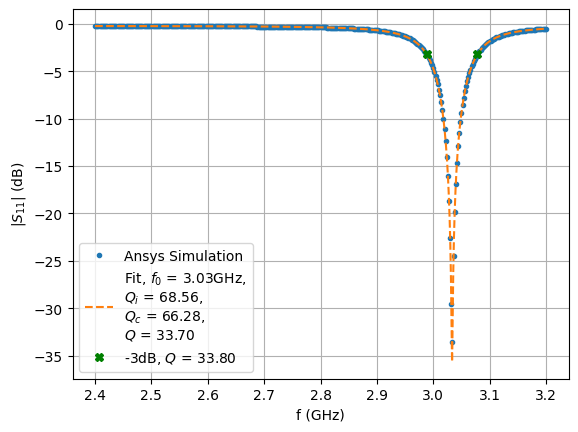

In [9]:
plot_S11('meander_v18_0', 4, f0_guess=3) # L_feedline = 3.1mm, d = 0.1mm

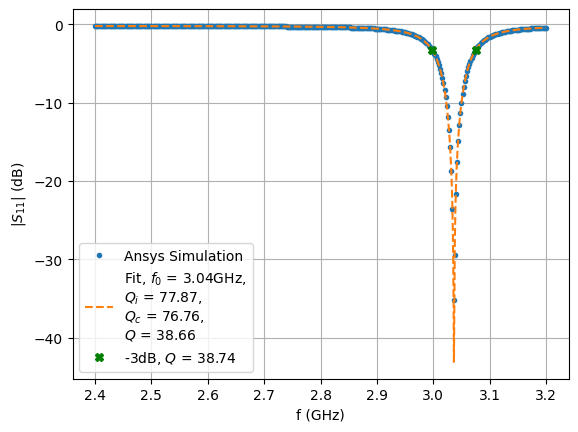

In [10]:
plot_S11('meander_v18_1', 4, f0_guess=3) # L_feedline = 3.1mm, d = 0.12mm

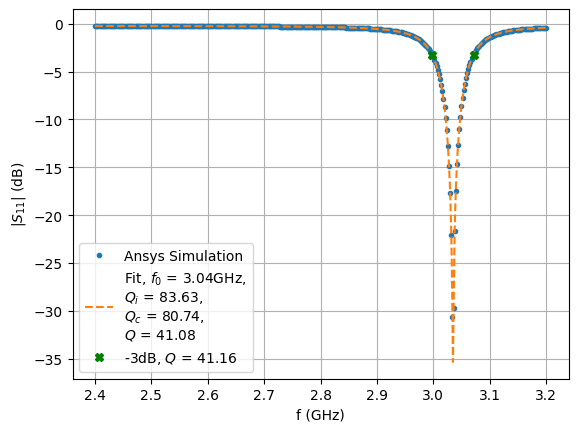

In [12]:
plot_S11('meander_v18_2', 4, f0_guess=3) # L_feedline = 3.3mm, d = 0.14mm

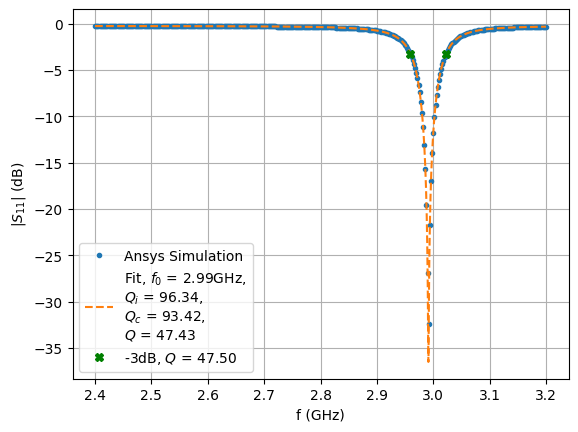

In [13]:
plot_S11('meander_v18_3', 4, f0_guess=3) # L_feedline = 3.3mm, d = 0.16mm

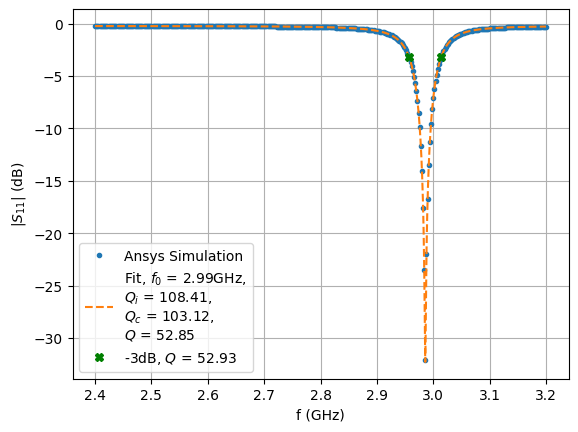

In [16]:
plot_S11('meander_v18_4_1', 4, f0_guess=3) # L_feedline = 3.3mm, d = 0.18mm

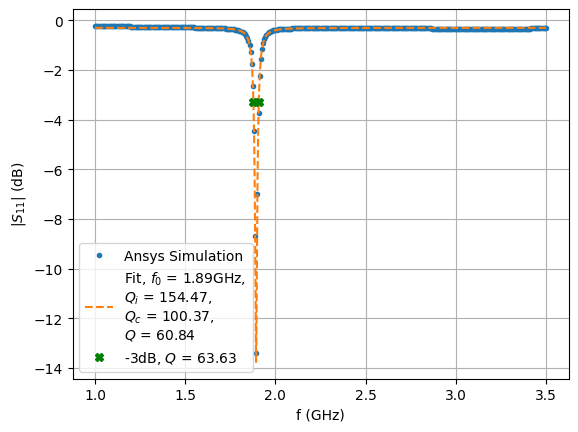

In [23]:
plot_S11('3layer_v2_loaded', 4, f0_guess=2) # L_feedline = 3.3mm, d = 0.18mm

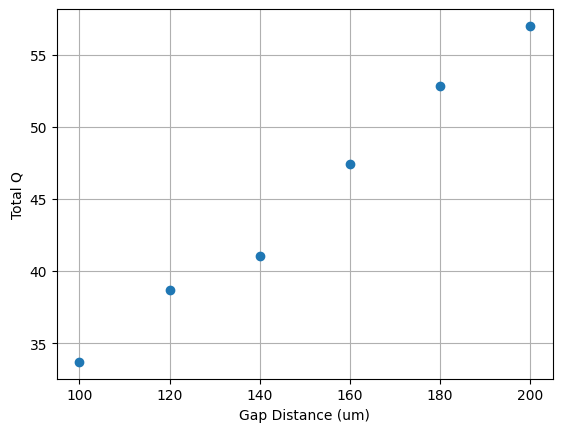

In [18]:
D = np.array([100, 120, 140, 160, 180, 200])
Q = np.array([33.7, 38.66, 41.08, 47.43, 52.85, 57.01])
plot(D, Q, 'o', xlabel='Gap Distance (um)', ylabel='Total Q')

In [25]:
0.008243/(2*np.pi*1.89e9) # Im(Y) = omega*C -> C = Im(Y)/(2pi*f)

6.941344951886208e-13

In [51]:
0.011981/(2*np.pi*2.5e9) # Im(Y) = omega*C -> C = Im(Y)/(2pi*f)

7.627341492735993e-13

In [23]:
1/0.025416

39.345294302801385

In [9]:
(0.125-0.03)/0.25 * 20

7.6

In [7]:
C = 0.7e-12
omega = 2*np.pi * 2.5e9
Y0 = 1/50
omega*C/Y0

0.5497787143782138

0.007478000000000462 0.0008196803061314428


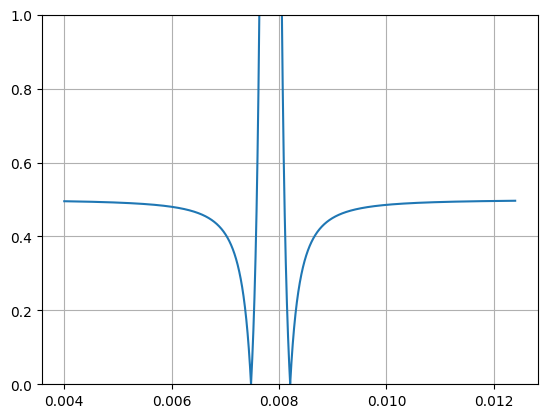

In [54]:
Zr = 81.894
Yr = 1/Zr
ZL = 0.22818-1j*83.466
YL = 3.2753e-5 + 1j*0.011981
gamma = (ZL-Zr)/(ZL+Zr) 
Re_Y1 = 1/Zr 
Y01 = Yr 
lam = 3e8/np.sqrt(3.747)/(2.5e9) 
lt = np.arange(0.004, lam*0.2, 1e-6)
y = lambda l: (1-gamma*np.exp(-1j*4*np.pi*l/lam)/(1+gamma*np.exp(-1j*4*np.pi*l/lam)))
f1 = abs(y(lt).real-1)
plot(lt, f1)
plt.ylim(0,1)
print(lt[np.argmin(f1)], np.min(f1))

In [55]:
l1 = lt[np.argmin(f1)]
Y1 = y(l1)*Y01
Ystub = Yr 
l2 = np.arctan(Y1.imag/Ystub)*lam/2/np.pi

In [56]:
l1*1e3, l2*1e3

(7.478000000000462, 14.7683805269903)

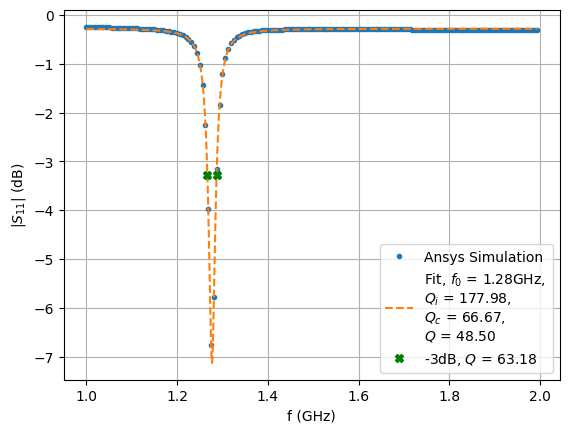

In [76]:
plot_S11('3layer_v2_loaded_m1', 2, f0_guess=1.2) # L_feedline = 3.3mm, d = 0.18mm

In [58]:
## Ignore the garbage above... rethink... 
f0 = 2.5e9 
eps = 3.747 
c = 3e8 
v = c/np.sqrt(eps)
lam = v/f0 
beta = 2*np.pi/lam 
omega = 2*np.pi*f0 
s = 1j*omega 

In [59]:
Zc = 1/(s*0.6e-12)
Zs = 50 + Zc 
Zs

(50-106.10329539459691j)

In [60]:
Zr = 81.894

In [65]:
l_stub = 30.446/360*lam
l_tln = 11.151/360*lam
l_stub*1e3, l_tln*1e3

(5.24284648968616, 1.9202187875744061)

In [61]:
ZL = 0.22818-1j*83.466

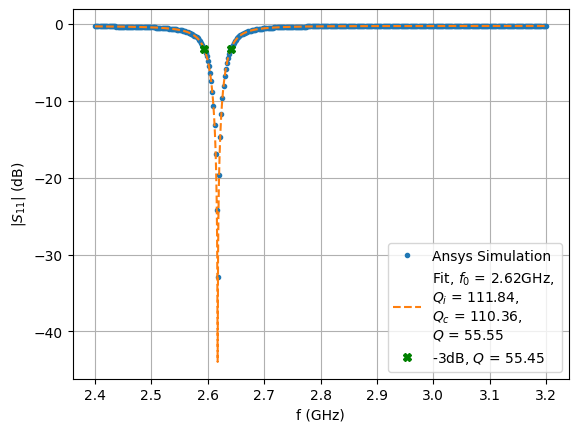

In [81]:
plot_S11('meander_v17L-0', 4, f0_guess=2.6) # L_feedline = 3.3mm, d = 0.18mm

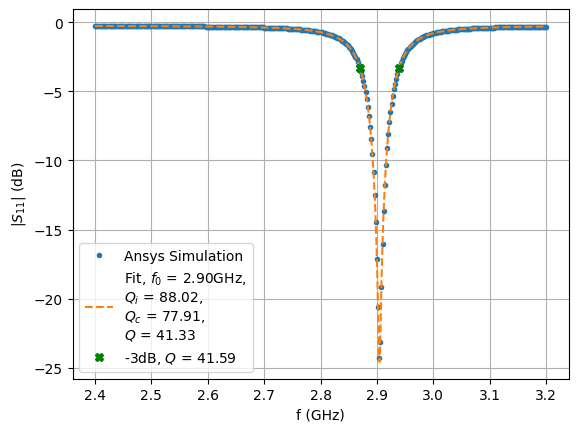

In [90]:
plot_S11('meander_v17L-1', 4, f0_guess=2.9) # W = 0.3mm

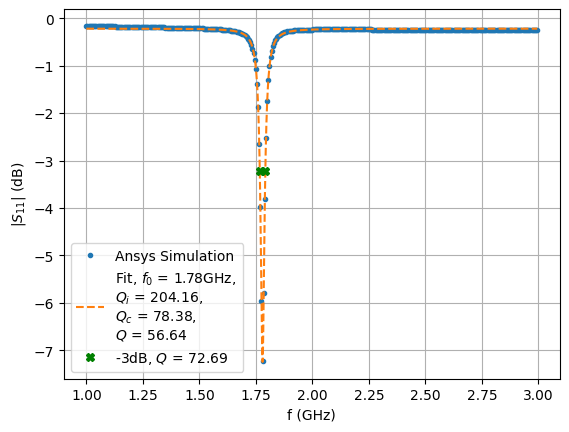

In [88]:
plot_S11('3layer_v2_loaded', 3, f0_guess=1.7) # L_feedline = 3.3mm, d = 0.18mm

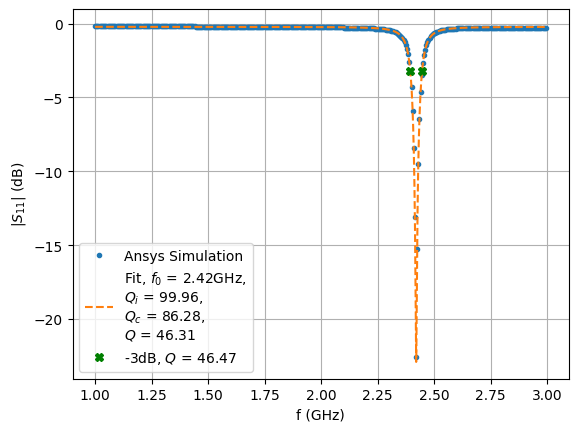

In [82]:
plot_S11('3layer_v2_loaded_2', 3, f0_guess=2.2) # L_feedline = 3.3mm, d = 0.18mm

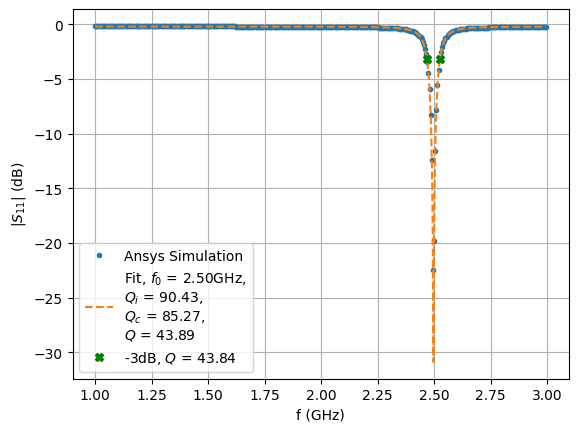

In [84]:
plot_S11('3layer_v2_loaded_3', 3, f0_guess=2.5) # L_feedline = 3.3mm, d = 0.18mm

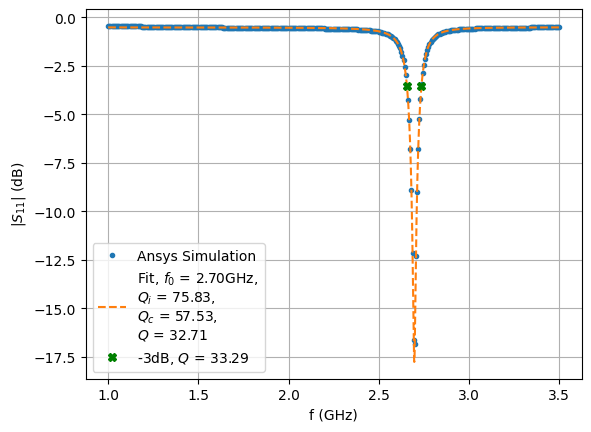

In [98]:
plot_S11('3layer_v3_loaded', 4, f0_guess=2.75) # L_feedline = 3.3mm, d = 0.18mm

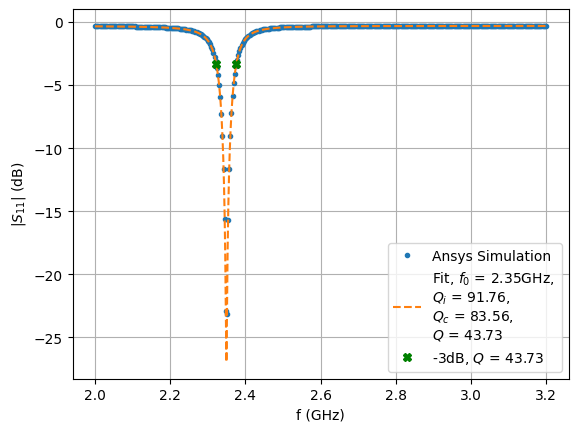

In [103]:
plot_S11('3layer_v3_loaded_1', 4, f0_guess=2.3) # L_feedline = 3.3mm, d = 0.18mm

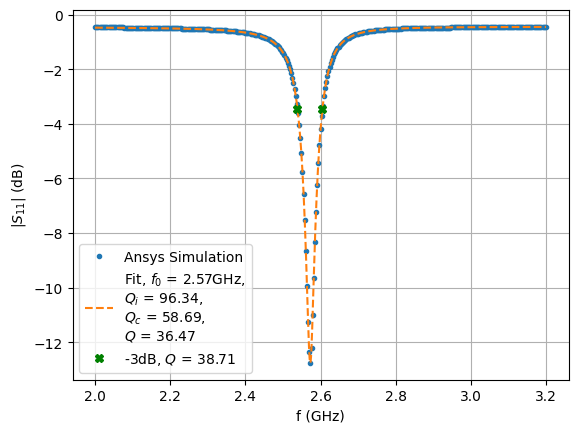

In [96]:
plot_S11('3layer_v3_loaded_2', 4, f0_guess=2.5) # L_feedline = 3.3mm, d = 0.18mm

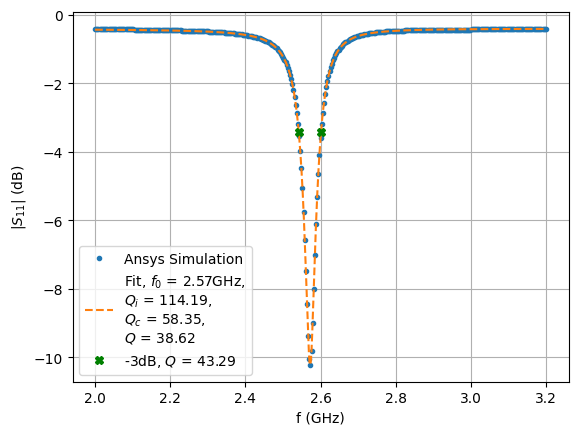

In [99]:
plot_S11('3layer_v3_loaded_2_1', 4, f0_guess=2.5) # L_feedline = 3.3mm, d = 0.18mm

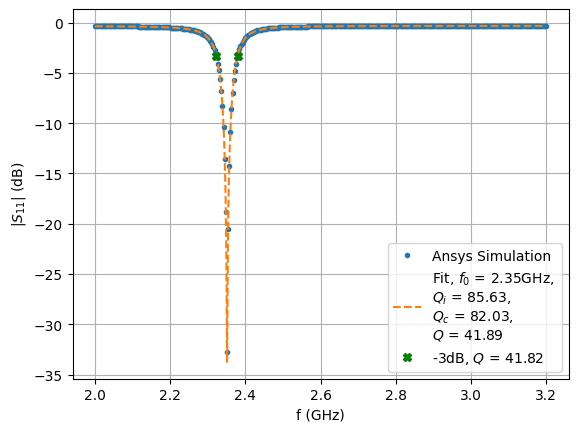

In [106]:
plot_S11('3layer_v3_loaded_1_1', 4, f0_guess=2.4) # L_feedline = 3.3mm, d = 0.18mm

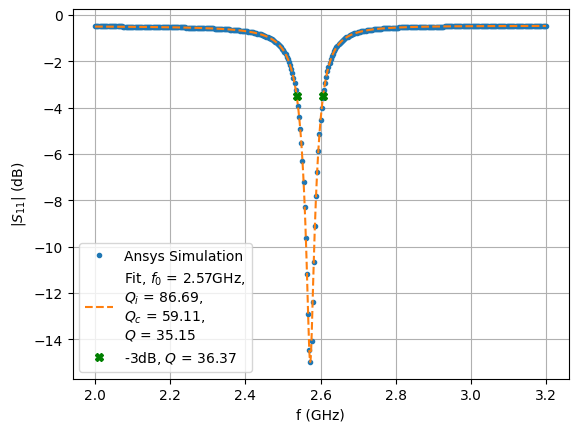

In [100]:
plot_S11('3layer_v3_loaded_2_2', 4, f0_guess=2.5) # L_feedline = 3.3mm, d = 0.18mm

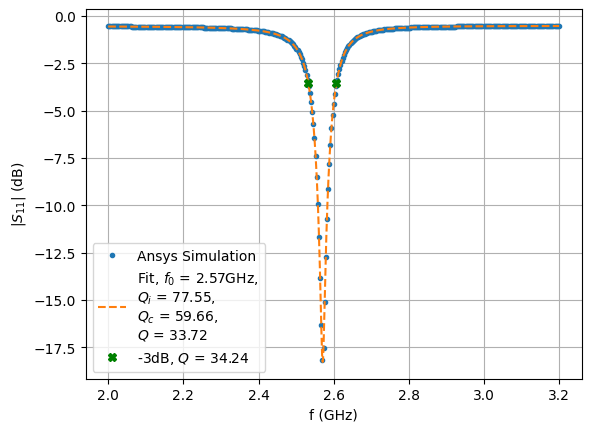

In [101]:
plot_S11('3layer_v3_loaded_2_3', 4, f0_guess=2.5) # L_feedline = 3.3mm, d = 0.18mm

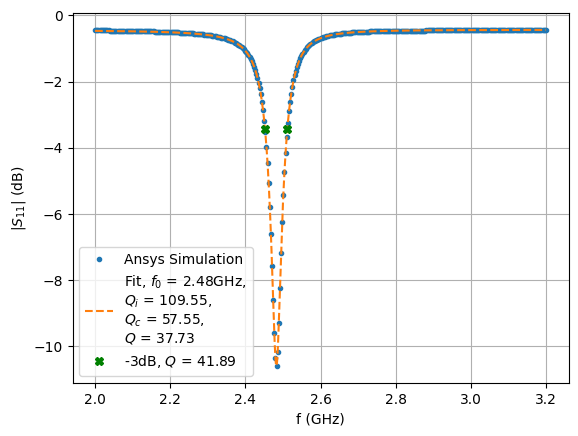

In [107]:
plot_S11('3layer_v3_loaded_3', 4, f0_guess=2.5) # L_feedline = 3.3mm, d = 0.18mm

## Material Studies

In [144]:
class Metal:
    def __init__(self, name, Y_4K, Y_300K):
        self.name = name
        self.Y_4K = Y_4K
        self.Y_300K = Y_300K

    def __str__(self):
        return f'{self.name}: {self.Y_4K:.3e} S/m at 4K, {self.Y_300K:.3e} S/m at 300K'

class Substrate: 
    def __init__(self, name, delta_300K, delta_4K=None): 
        self.name = name 
        self.delta_4K = delta_4K
        self.delta_300K = delta_300K

In [145]:
Al = Metal('Al', 1/(0.000109e-8), 1/(2.733e-8))
Cu = Metal('Cu', 1/(8e-3*1e-8), 1/(16.78e-9))
Au = Metal('Au', 1/(0.0223e-8), 1/(2.271e-8))

In [146]:
Glass = Substrate('Glass', 3.59e-5)
RO4003C = Substrate('RO4003C', 0.0021)
Sapphire = Substrate('Sapphire', 0.00002)
Polymer = Substrate('Polymer', 0.02)
Alumina = Substrate('Alumina', 0.0001)

In [147]:
vert_line_colors = ['gold', 'darkorange', 'pink', 'purple', 'lime', 'darkgreen']
vert_line_colors_2 = ['green', 'grey', 'purple', 'red', 'orange']

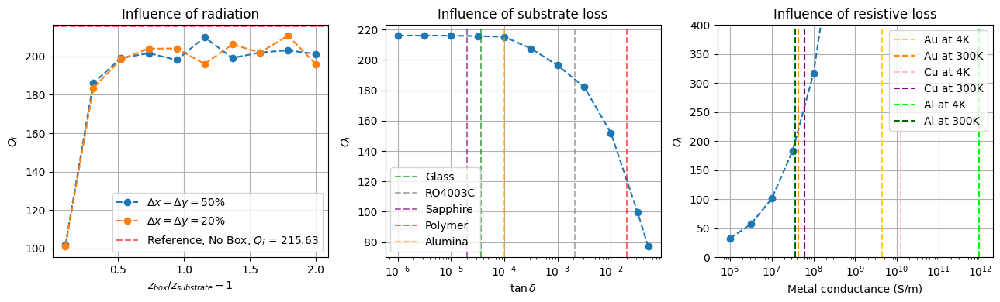

In [167]:
Q0 = 215.628
fig, ax = plt.subplots(ncols=3, figsize=(13, 4))
df = pd.read_csv(f'{base}/meander_v6_sweep1.csv')
z_percent, Q = np.array(df['z_percent']), np.array(df['Q(1)'])
plot_ax(ax[0], z_percent, Q, 'o--', label=r'$\Delta x = \Delta y = 50\%$')
df = pd.read_csv(f'{base}/meander_v6_sweep2.csv')
z_percent, Q = np.array(df['z_percent']), np.array(df['Q(1)'])
plot_ax(ax[0], z_percent, Q, 'o--', label=r'$\Delta x = \Delta y = 20\%$', 
     xlabel=r'$z_{box}/z_{substrate}-1$', ylabel=r'$Q_i$', title='Influence of radiation')
ax[0].axhline(Q0, linestyle='--', color='r', alpha=0.6, label=f'Reference, No Box, $Q_i$ = {Q0:.2f}')
ax[0].legend(loc='lower right')

df = pd.read_csv(f'{base}/meander_v6_sweep3.csv')
z_percent, Q = np.array(df['$glass_loss']), np.array(df['Q(1)'])
idx = np.argsort(Q)
plot_ax(ax[1], z_percent[idx], Q[idx], 'o--', ylabel=r'$Q_i$',  
     xlabel=r'$\tan \delta$', title='Influence of substrate loss')
colors = iter(vert_line_colors_2)
for substrate in [Glass, RO4003C, Sapphire, Polymer, Alumina]:
    ax[1].axvline(substrate.delta_300K, linestyle='--', color=next(colors), alpha=0.6, label=substrate.name)
    
ax[1].set_xscale('log')
#ax[1].axhline(Q0, linestyle='--', color='r', alpha=0.6, label=f'Reference, Fused Silica, $Q_i$ = {Q0:.2f}')
ax[1].legend(loc='lower left')

df = pd.read_csv(f'{base}/meander_v6_sweep4.csv')
z_percent, Q = np.array(df['$metal_conductance']), np.array(df['Q(1)'])
plot_ax(ax[2], z_percent, Q, 'o--', ylabel=r'$Q_i$',  
     xlabel=r'Metal conductance (S/m)', title='Influence of resistive loss')
colors = iter(vert_line_colors)
for metal in [Au, Cu, Al]:
    ax[2].axvline(metal.Y_4K, linestyle='--', color=next(colors), label=f"{metal.name} at 4K")
    ax[2].axvline(metal.Y_300K, linestyle='--', color=next(colors), label=f"{metal.name} at 300K")
ax[2].set_ylim(0, 400)
ax[2].set_xscale('log')
#ax[2].axhline(Q0, linestyle='--', color='r', alpha=0.6, label=f'Reference, Pure Gold, $Q_i$ = {Q0:.2f}')
ax[2].legend(loc='upper right')

plt.tight_layout()
plt.show()

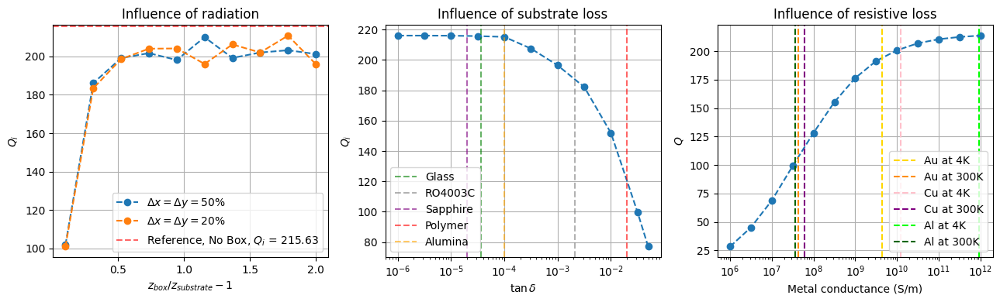

In [160]:
Q0 = 215.628
fig, ax = plt.subplots(ncols=3, figsize=(13, 4))
df = pd.read_csv(f'{base}/meander_v6_sweep1.csv')
z_percent, Q = np.array(df['z_percent']), np.array(df['Q(1)'])
plot_ax(ax[0], z_percent, Q, 'o--', label=r'$\Delta x = \Delta y = 50\%$')
df = pd.read_csv(f'{base}/meander_v6_sweep2.csv')
z_percent, Q = np.array(df['z_percent']), np.array(df['Q(1)'])
plot_ax(ax[0], z_percent, Q, 'o--', label=r'$\Delta x = \Delta y = 20\%$', 
     xlabel=r'$z_{box}/z_{substrate}-1$', ylabel=r'$Q_i$', title='Influence of radiation')
ax[0].axhline(Q0, linestyle='--', color='r', alpha=0.6, label=f'Reference, No Box, $Q_i$ = {Q0:.2f}')
ax[0].legend(loc='lower right')

df = pd.read_csv(f'{base}/meander_v6_sweep3.csv')
z_percent, Q = np.array(df['$glass_loss']), np.array(df['Q(1)'])
idx = np.argsort(Q)
plot_ax(ax[1], z_percent[idx], Q[idx], 'o--', ylabel=r'$Q_i$',  
     xlabel=r'$\tan \delta$', title='Influence of substrate loss')
colors = iter(vert_line_colors_2)
for substrate in [Glass, RO4003C, Sapphire, Polymer, Alumina]:
    ax[1].axvline(substrate.delta_300K, linestyle='--', color=next(colors), alpha=0.6, label=substrate.name)
    
ax[1].set_xscale('log')
#ax[1].axhline(Q0, linestyle='--', color='r', alpha=0.6, label=f'Reference, Fused Silica, $Q_i$ = {Q0:.2f}')
ax[1].legend(loc='lower left')

df = pd.read_csv(f'{base}/meander_v6_sweep4.csv')
z_percent, Q = np.array(df['$metal_conductance']), np.array(df['Q(1)'])
plot_ax(ax[2], z_percent, get_Q(Q, Q0), 'o--', ylabel=r'$Q$',  
     xlabel=r'Metal conductance (S/m)', title='Influence of resistive loss')
colors = iter(vert_line_colors)
for metal in [Au, Cu, Al]:
    ax[2].axvline(metal.Y_4K, linestyle='--', color=next(colors), label=f"{metal.name} at 4K")
    ax[2].axvline(metal.Y_300K, linestyle='--', color=next(colors), label=f"{metal.name} at 300K")
#ax[2].set_ylim(0, 500)
ax[2].set_xscale('log')
#ax[2].axhline(Q0, linestyle='--', color='r', alpha=0.6, label=f'Reference, Pure Gold, $Q_i$ = {Q0:.2f}')
ax[2].legend(loc='lower right')

plt.tight_layout()
plt.show()

## out-of-phase drives

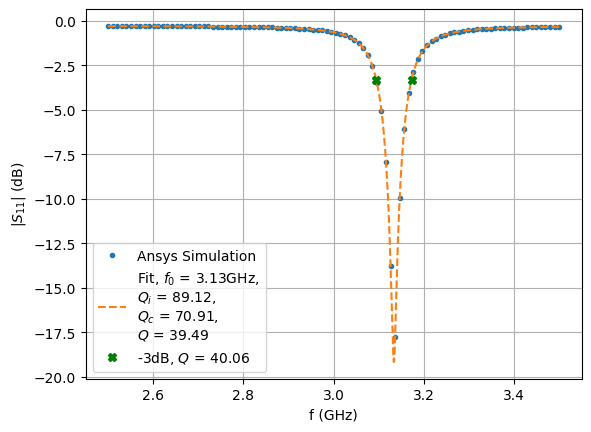

In [17]:
plot_S11('3layer_v7_13_3', 4, f0_guess=3) # L_feedline = 3.3mm, d = 0.18mm

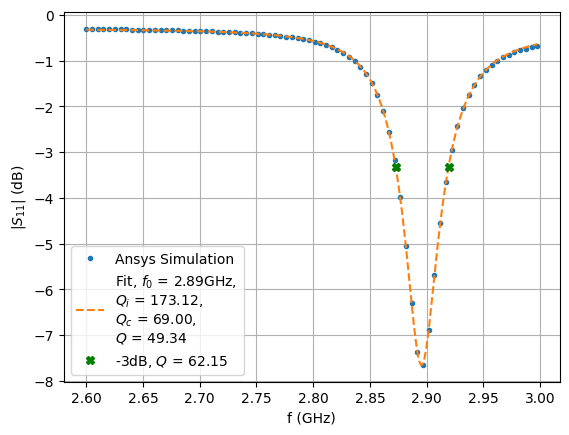

In [12]:
plot_S11('3layer_v7_13_4', 3, f0_guess=2.89) # L_feedline = 3.3mm, d = 0.18mm

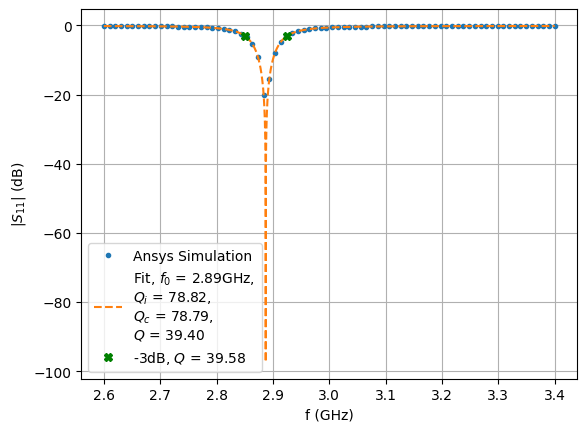

In [9]:
plot_S11('3layer_v7_13_5', 4, f0_guess=2.9) # L_feedline = 3.3mm, d = 0.18mm

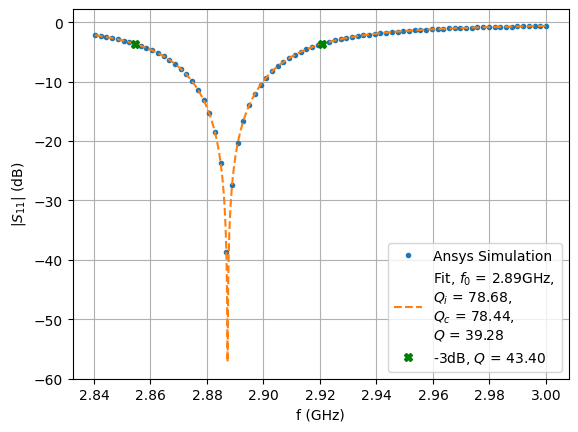

In [15]:
plot_S11('3layer_v7_13_5_2', (2.84, 4), f0_guess=2.9) # L_feedline = 3.3mm, d = 0.18mm

In [6]:
from PaulTrapAnalysis.functions import plotting

In [146]:
df = pd.read_csv(f'{base}/test_E2.fld', sep=' ', skiprows=1)
X, Y, Z, pp_rf = df['X,'], df['Y,'], df['Z,'], df['data']

In [40]:
df = pd.read_csv(f'{base}/v7_22_oop.fld', sep=' ', skiprows=1)
X, Y, Z, pp_rf = df['X,'], df['Y,'], df['Z,'], df['data']

In [41]:
df

,"X,","Y,","Z,",Scalar,data,Pseudopotential_eV
0,-0.00015,-0.000150,0.0,NaN,0.160183,NaN
1,-0.00015,-0.000149,0.0,NaN,0.156281,NaN
2,-0.00015,-0.000148,0.0,NaN,0.152557,NaN
3,-0.00015,-0.000147,0.0,NaN,0.149006,NaN
4,-0.00015,-0.000146,0.0,NaN,0.145621,NaN
...,...,...,...,...,...,...
90596,0.00015,0.000146,0.0,NaN,0.163060,NaN
90597,0.00015,0.000147,0.0,NaN,0.165662,NaN
90598,0.00015,0.000148,0.0,NaN,0.168308,NaN
90599,0.00015,0.000149,0.0,NaN,0.170997,NaN


In [42]:
def line_3D(R, x0, y0, a, b, c, d): 
    x, y = R 
    return (a*(x-x0) + b*(y-y0) + d)*c

In [35]:
z_grid_data = {}
all_x, all_y = [], []
for i in range(len(Z)):
    z = Z[i]
    if z not in z_grid_data: 
        z_grid_data[z] = [[X[i], Y[i], pp_rf[i]]]
    else: 
        z_grid_data[z].extend([[X[i], Y[i], pp_rf[i]]])
        

for z in z_grid_data: 
    #print(z_grid[z])
    xx, yy, pp = np.array(z_grid_data[z]).T 
    imin = np.argmin(pp)
    xmin, ymin = xx[imin], yy[imin] 
    all_x.append(xmin*1e6) 
    all_y.append(ymin*1e6)

z_grid = np.array([z for z in z_grid_data])*1e6
p, c = curve_fit(line_3D, [np.array(all_x), np.array(all_y)], z_grid, xtol=1e-10)
xp = np.linspace(min(all_x), max(all_x), 100)
yp = np.linspace(min(all_y), max(all_y), 100) 
XP, YP = np.meshgrid(xp, yp)
ZP = line_3D((XP, YP), *p)
xpp = XP.flatten()
ypp = YP.flatten()
zpp = ZP.flatten()



coord = [X, Y, Z]
fig = plt.figure()
ax = fig.add_subplot(1,1,1, projection='3d')
im = plotting.plot_potential(coord, np.log10(pp_rf), size=10,n=1, scale=1e6, cmap='seismic', title='Pseudo-potential', ax=ax)

ax.plot(xpp, ypp, zpp, '--', linewidth=10)
ax.plot(all_x, all_y, z_grid, 'o')
#cbar = fig.colorbar(im, ax=ax, shrink=0.8)
#cbar.ax.set_yscale('log')
#cbar.ax.set_ylim(10, 1e-3)
cbar.ax.set_ylabel("Pseudopotential (eV)")
plt.tight_layout() 
plt.show()

ValueError: `ydata` must not be empty!

In [43]:
z_grid_data = {}
all_x, all_y = [], []
for i in range(len(Z)):
    z = Z[i]
    if z not in z_grid_data: 
        z_grid_data[z] = [[X[i], Y[i], pp_rf[i]]]
    else: 
        z_grid_data[z].extend([[X[i], Y[i], pp_rf[i]]])
        

for z in z_grid_data: 
    #print(z_grid[z])
    xx, yy, pp = np.array(z_grid_data[z]).T 
    imin = np.argmin(pp)
    xmin, ymin = xx[imin], yy[imin] 
    all_x.append(xmin*1e6) 
    all_y.append(ymin*1e6)

z_grid = np.array([z for z in z_grid_data])*1e6
p, c = curve_fit(line_3D, [np.array(all_x), np.array(all_y)], z_grid, xtol=1e-10)
xp = np.linspace(min(all_x), max(all_x), 100)
yp = np.linspace(min(all_y), max(all_y), 100) 
XP, YP = np.meshgrid(xp, yp)
ZP = line_3D((XP, YP), *p)
xpp = XP.flatten()
ypp = YP.flatten()
zpp = ZP.flatten()



coord = [X, Y, Z]
fig = plt.figure()
ax = fig.add_subplot(1,1,1, projection='3d')
im = plotting.plot_potential(coord, np.log10(pp_rf), size=10,n=1, scale=1e6, cmap='seismic', title='Pseudo-potential', ax=ax)

ax.plot(xpp, ypp, zpp, '--', linewidth=10)
ax.plot(all_x, all_y, z_grid, 'o')
#cbar = fig.colorbar(im, ax=ax, shrink=0.8)
#cbar.ax.set_yscale('log')
#cbar.ax.set_ylim(10, 1e-3)
cbar.ax.set_ylabel("Pseudopotential (eV)")
plt.tight_layout() 
plt.show()

TypeError: Improper input: func input vector length N=6 must not exceed func output vector length M=1

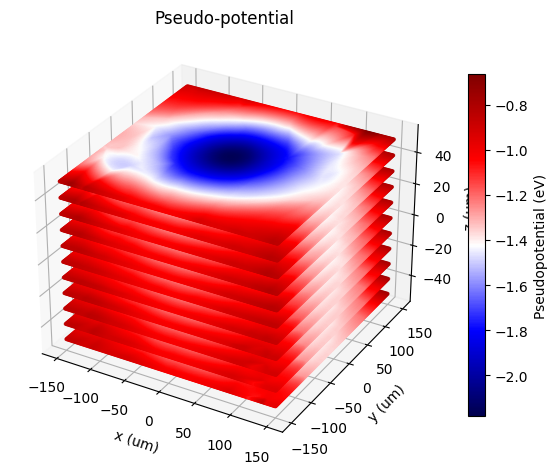

In [148]:
coord = [X, Y, Z]
fig = plt.figure()
ax = fig.add_subplot(1,1,1, projection='3d')
im = plotting.plot_potential(coord, np.log10(pp_rf), size=10,n=1, scale=1e6, cmap='seismic', title='Pseudo-potential', ax=ax)

ax.plot(xpp, ypp, zpp, '--', linewidth=10)
ax.plot(all_x, all_y, z_grid, 'o')
cbar = fig.colorbar(im, ax=ax, shrink=0.8)
#cbar.ax.set_yscale('log')
#cbar.ax.set_ylim(10, 1e-3)
cbar.ax.set_ylabel("Pseudopotential (eV)")
plt.tight_layout() 
plt.show()

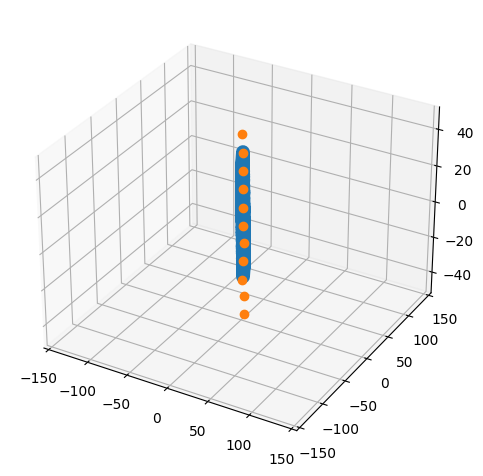

In [152]:
coord = [X, Y, Z]
fig = plt.figure()
ax = fig.add_subplot(1,1,1, projection='3d')
#im = plotting.plot_potential(coord, np.log10(pp_rf), size=10,n=1, scale=1e6, cmap='seismic', title='Pseudo-potential', ax=ax)

ax.plot(xpp, ypp, zpp, '--', linewidth=10)
ax.plot(all_x, all_y, z_grid, 'o')
#cbar = fig.colorbar(im, ax=ax, shrink=0.8)
#cbar.ax.set_yscale('log')
#cbar.ax.set_ylim(10, 1e-3)
ax.set_xlim(-150, 150)
ax.set_ylim(-150,150)
cbar.ax.set_ylabel("Pseudopotential (eV)")
plt.tight_layout() 
plt.show()

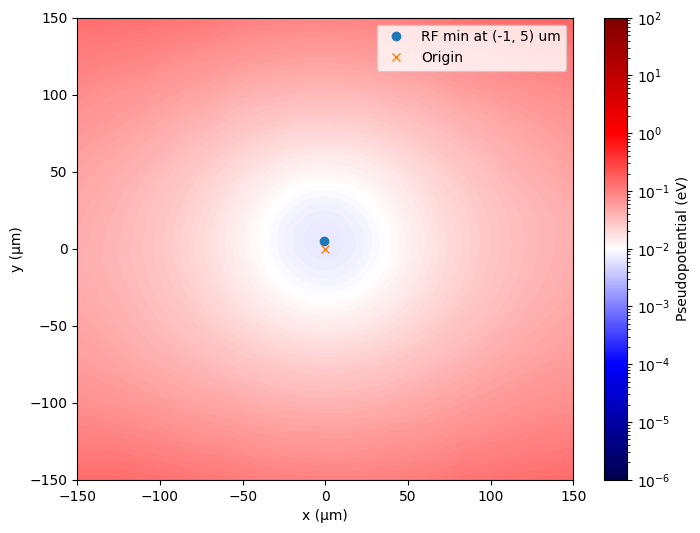

In [168]:
from matplotlib import ticker

x_plot, y_plot, pp_plot = np.array(z_grid_data[0]).T
clim = (-6, 2)

fig, ax = plt.subplots(figsize = (8,6))
level = np.logspace(*clim, 1000, base = 10, endpoint = True) # min max level in the plot
contp = ax.tricontourf(1e6 * x_plot[:], 1e6 * y_plot[:],
                    pp_plot,
                    locator=ticker.LogLocator(),
                    levels = level,
                    cmap = "seismic")
cbar = fig.colorbar(contp,
                    ticks = [0.001, 0.01,0.1,1,10,100, 1000]
                   )

imin = np.argmin(abs(pp_plot))
xmin, ymin = x_plot[imin], y_plot[imin]
ax.plot(xmin*1e6, ymin*1e6, 'o', label=f'RF min at ({1e6*xmin:.0f}, {1e6*ymin:.0f}) um')
ax.plot(0, 0, 'x', label=f'Origin')
#ax.set_aspect('equal')
ax.set_xlabel("x (µm)")
ax.set_ylabel("y (µm)")
cbar.ax.set_ylabel("Pseudopotential (eV)")
cbar.ax.set_yscale("log")
#ax.set_title(title)
#
ax.legend()
ax.set_xlim((-150, 150))
ax.set_ylim((-150, 150))
plt.show()

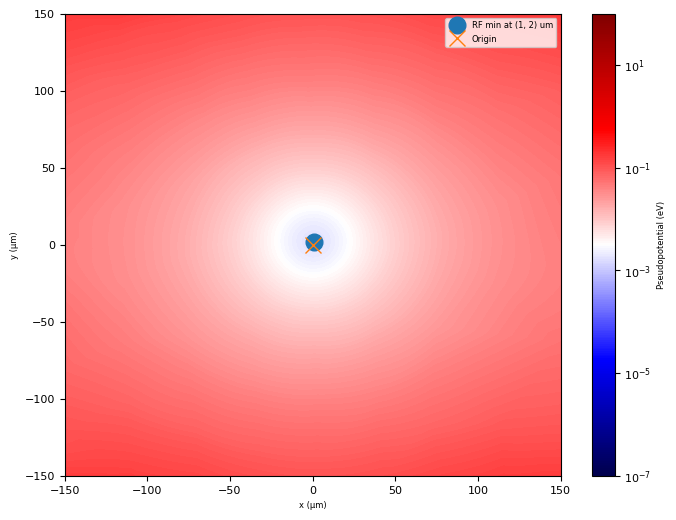

In [46]:
from matplotlib import ticker

x_plot, y_plot, pp_plot = np.array(z_grid_data[0]).T
clim = (-7, 2)

fig, ax = plt.subplots(figsize = (8,6))
level = np.logspace(*clim, 1000, base = 10, endpoint = True) # min max level in the plot
contp = ax.tricontourf(1e6 * x_plot[:], 1e6 * y_plot[:],
                    pp_plot,
                    locator=ticker.LogLocator(),
                    levels = level,
                    cmap = "seismic")
cbar = fig.colorbar(contp,
                    ticks = [0.001, 0.01,0.1,1,10,100, 1000]
                   )

imin = np.argmin(abs(pp_plot))
xmin, ymin = x_plot[imin], y_plot[imin]
ax.plot(xmin*1e6, ymin*1e6, 'o', label=f'RF min at ({1e6*xmin:.0f}, {1e6*ymin:.0f}) um')
ax.plot(0, 0, 'x', label=f'Origin')
#ax.set_aspect('equal')
ax.set_xlabel("x (µm)")
ax.set_ylabel("y (µm)")
cbar.ax.set_ylabel("Pseudopotential (eV)")
cbar.ax.set_yscale("log")
#ax.set_title(title)
#
ax.legend()
ax.set_xlim((-150, 150))
ax.set_ylim((-150, 150))
plt.show()

x trap frequency is about 157.536 MHz
y trap frequency is about 159.033 MHz


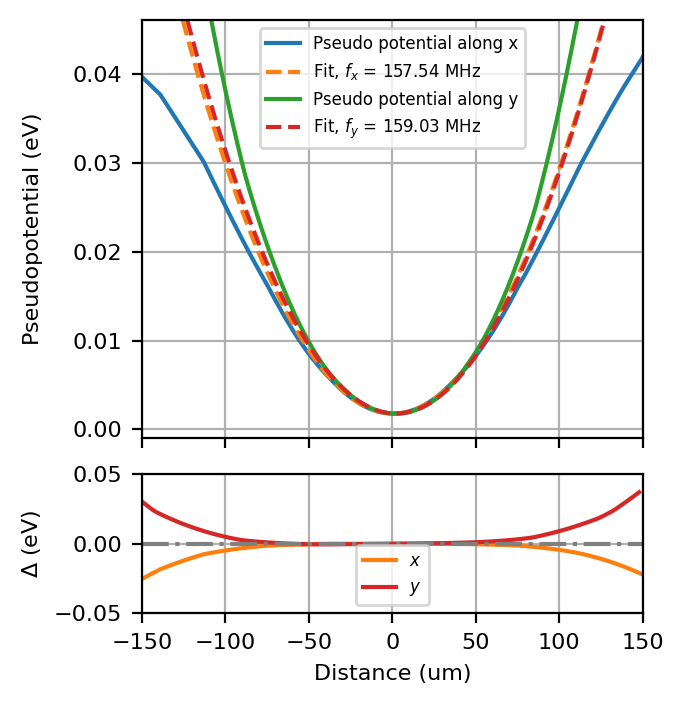

In [67]:
from scipy.constants import m_e, e, k
from PaulTrapAnalysis.extensions.Electron import small_plt_font, TrapFrequency

def parabola(x, x0, amp, bias):
    return amp * (x - x0)**2 + bias

fit_range = 25e-6
xmin_idx = np.where(x_plot==xmin)
ymin_idx = np.where(y_plot==ymin)
px = pp_plot[ymin_idx]*e # in J, SI units
py = pp_plot[xmin_idx]*e # in J

x_SI, y_SI = x_plot[ymin_idx], y_plot[xmin_idx]
fit_xlim1 = x_SI[np.argmin(px)]-fit_range
fit_xlim2 = x_SI[np.argmin(px)]+fit_range
argx1 = np.argmin(np.abs(x_SI - fit_xlim1))
argx2 = np.argmin(np.abs(x_SI - fit_xlim2))

fit_ylim1 = y_SI[np.argmin(py)]-fit_range
fit_ylim2 = y_SI[np.argmin(py)]+fit_range
argy1 = np.argmin(np.abs(y_SI - fit_ylim1))
argy2 = np.argmin(np.abs(y_SI - fit_ylim2))


### fit the data ###
poptx, pcovx = curve_fit(parabola, x_SI[argx1:argx2], px[argx1:argx2], p0 = [x_SI[np.argmin(px)], 1E7, 0], xtol=1e-10)
x0 = poptx[0]
x_amp = poptx[1]
x_coordinates = x_SI

popty, pcovy = curve_fit(parabola, y_SI[argy1:argy2],py[argy1:argy2], p0 = [y_SI[np.argmin(py)], 1E7, 0], xtol=1e-10)
y0 = popty[0]
y_amp = popty[1]
y_coordinates = y_SI - y0


### Find trap frequencies ###
k = 1
x_range = np.linspace(k*x_coordinates[0],k*x_coordinates[-1], 1000)
y_range = np.linspace(k*y_coordinates[0],k*y_coordinates[-1], 1000)
fit_x = parabola(x_range, *poptx) #parabola0(x_range, x_amp)
fit_y = parabola(y_range, *popty) #parabola0(y_range, y_amp)
fit_x_match = parabola(x_coordinates, *poptx)
fit_y_match = parabola(y_coordinates, *popty)

d2Udx2 = 2*x_amp
trapf_x = TrapFrequency(d2Udx2,m_e)
print(f'x trap frequency is about {trapf_x/1E6:.3f} MHz')
d2Udy2 = 2*y_amp
trapf_y = TrapFrequency(d2Udy2,m_e)
print(f'y trap frequency is about {trapf_y/1E6:.3f} MHz')

### Plot pseudo-potential fit ###
small_plt_font()

fig, (ax1, ax2) = plt.subplots(2,1,sharex = True, 
                               gridspec_kw={'height_ratios': [3, 1]},
                               figsize=(3.4,3.5), dpi = 200)
ax1.plot(x_SI*1e6, px/e, label = "Pseudo potential along x")
ax1.plot(x_range*1E6, fit_x/e, '--', label = f"Fit, $f_x$ = {trapf_x/1E6:.2f} MHz")
ax1.plot(y_SI*1e6,py/e, label = "Pseudo potential along y")
ax1.plot(y_range*1E6, fit_y/e, '--', label = f"Fit, $f_y$ = {trapf_y/1E6:.2f} MHz")
ax1.grid()
ax1.legend()
ax1.set_ylim(-1E-3, k**2*np.max(px)*1.1/e)
ax1.set_ylabel('Pseudopotential (eV)', size = 8)

ax2.plot(x_coordinates*1E6,(px-fit_x_match)/e, '-', color = 'C1', label='$x$')
ax2.plot(y_coordinates*1E6,(py-fit_y_match)/e, '-', color = 'C3', label='$y$')
ax2.set_xlabel('Distance (um)', size = 8)
ax2.set_ylabel('$\Delta$ (eV)', size = 8)
ax2.set_ylim(-0.05, 0.05)
ax2.set_xlim(k*x_coordinates[0]*1E6, k*x_coordinates[-1]*1E6)
ax2.axhline(y = 0, color = 'grey', linestyle = '-.')
ax2.grid()
ax2.legend()
fig.align_ylabels()
fig.tight_layout()
# plt.savefig('Electron_3layer_pseudo_y_1p6GHz_90V.png', bbox_inches = 'tight')

plt.show()

x trap frequency is about 148.494 MHz
y trap frequency is about 147.057 MHz


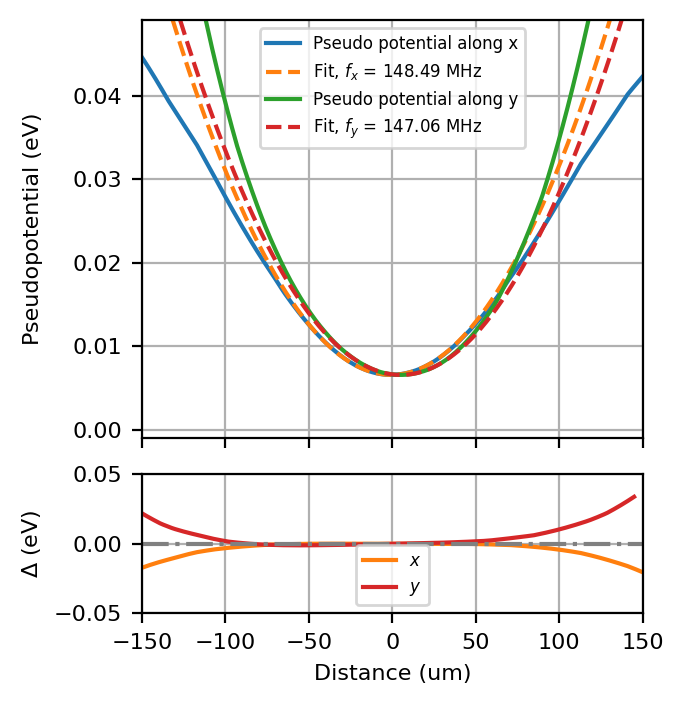

In [176]:
from scipy.constants import m_e, e, k
from PaulTrapAnalysis.extensions.Electron import small_plt_font, TrapFrequency

def parabola(x, x0, amp, bias):
    return amp * (x - x0)**2 + bias

fit_range = 25e-6
xmin_idx = np.where(x_plot==xmin)
ymin_idx = np.where(y_plot==ymin)
px = pp_plot[ymin_idx]*e # in J, SI units
py = pp_plot[xmin_idx]*e # in J

x_SI, y_SI = x_plot[ymin_idx], y_plot[xmin_idx]
fit_xlim1 = x_SI[np.argmin(px)]-fit_range
fit_xlim2 = x_SI[np.argmin(px)]+fit_range
argx1 = np.argmin(np.abs(x_SI - fit_xlim1))
argx2 = np.argmin(np.abs(x_SI - fit_xlim2))

fit_ylim1 = y_SI[np.argmin(py)]-fit_range
fit_ylim2 = y_SI[np.argmin(py)]+fit_range
argy1 = np.argmin(np.abs(y_SI - fit_ylim1))
argy2 = np.argmin(np.abs(y_SI - fit_ylim2))


### fit the data ###
poptx, pcovx = curve_fit(parabola, x_SI[argx1:argx2], px[argx1:argx2], p0 = [x_SI[np.argmin(px)], 1E7, 0], xtol=1e-10)
x0 = poptx[0]
x_amp = poptx[1]
x_coordinates = x_SI

popty, pcovy = curve_fit(parabola, y_SI[argy1:argy2],py[argy1:argy2], p0 = [y_SI[np.argmin(py)], 1E7, 0], xtol=1e-10)
y0 = popty[0]
y_amp = popty[1]
y_coordinates = y_SI - y0


### Find trap frequencies ###
k = 1
x_range = np.linspace(k*x_coordinates[0],k*x_coordinates[-1], 1000)
y_range = np.linspace(k*y_coordinates[0],k*y_coordinates[-1], 1000)
fit_x = parabola(x_range, *poptx) #parabola0(x_range, x_amp)
fit_y = parabola(y_range, *popty) #parabola0(y_range, y_amp)
fit_x_match = parabola(x_coordinates, *poptx)
fit_y_match = parabola(y_coordinates, *popty)

d2Udx2 = 2*x_amp
trapf_x = TrapFrequency(d2Udx2,m_e)
print(f'x trap frequency is about {trapf_x/1E6:.3f} MHz')
d2Udy2 = 2*y_amp
trapf_y = TrapFrequency(d2Udy2,m_e)
print(f'y trap frequency is about {trapf_y/1E6:.3f} MHz')

### Plot pseudo-potential fit ###
small_plt_font()

fig, (ax1, ax2) = plt.subplots(2,1,sharex = True, 
                               gridspec_kw={'height_ratios': [3, 1]},
                               figsize=(3.4,3.5), dpi = 200)
ax1.plot(x_SI*1e6, px/e, label = "Pseudo potential along x")
ax1.plot(x_range*1E6, fit_x/e, '--', label = f"Fit, $f_x$ = {trapf_x/1E6:.2f} MHz")
ax1.plot(y_SI*1e6,py/e, label = "Pseudo potential along y")
ax1.plot(y_range*1E6, fit_y/e, '--', label = f"Fit, $f_y$ = {trapf_y/1E6:.2f} MHz")
ax1.grid()
ax1.legend()
ax1.set_ylim(-1E-3, k**2*np.max(px)*1.1/e)
ax1.set_ylabel('Pseudopotential (eV)', size = 8)

ax2.plot(x_coordinates*1E6,(px-fit_x_match)/e, '-', color = 'C1', label='$x$')
ax2.plot(y_coordinates*1E6,(py-fit_y_match)/e, '-', color = 'C3', label='$y$')
ax2.set_xlabel('Distance (um)', size = 8)
ax2.set_ylabel('$\Delta$ (eV)', size = 8)
ax2.set_ylim(-0.05, 0.05)
ax2.set_xlim(k*x_coordinates[0]*1E6, k*x_coordinates[-1]*1E6)
ax2.axhline(y = 0, color = 'grey', linestyle = '-.')
ax2.grid()
ax2.legend()
fig.align_ylabels()
fig.tight_layout()
# plt.savefig('Electron_3layer_pseudo_y_1p6GHz_90V.png', bbox_inches = 'tight')

plt.show()

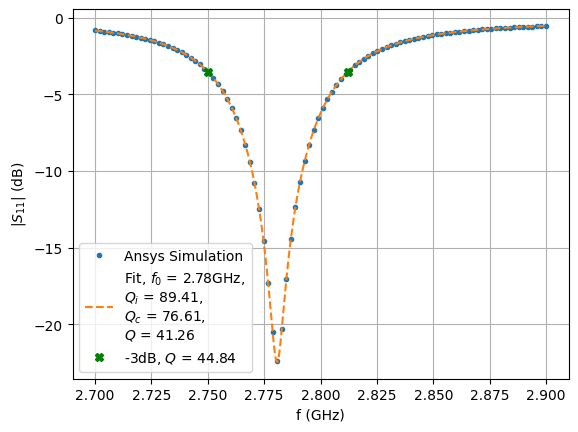

In [7]:
plot_S11('3layer_v7_22_oop', 3, f0_guess=2.78) # L_feedline = 3.3mm, d = 0.18mm

In [68]:
DC_fx = 596.869e6
DC_fy = 600.676e6
43/(DC_fx/trapf_x), 43/(DC_fx/trapf_y)

(11.349335420988274, 11.457175377973016)

In [55]:
from scipy.constants import m_e, e

In [66]:
Z = 150e3 
d = 690e-6 
1/(e**2*Z/m_e/d**2)*1e6

112.63545832436355

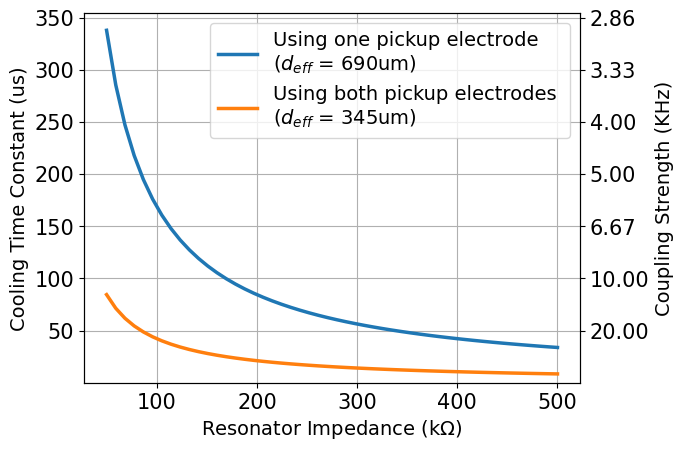

In [120]:
from PaulTrapAnalysis.extensions.Electron import big_plt_font
big_plt_font()
fig, ax = plt.subplots() 


ax2 = ax.twinx()

plot_ax(ax2, np.linspace(50, 500), 1/(e**2*np.linspace(50, 500)*1e3/m_e/d**2)*1e6, alpha=0)
plot_ax(ax2, np.linspace(50, 500), 1/(e**2*np.linspace(50, 500)*1e3/m_e/(d/2)**2)*1e6, alpha=0)
plot_ax(ax, np.linspace(50, 500), 1/(e**2*np.linspace(50, 500)*1e3/m_e/d**2)*1e6, label='Using one pickup electrode \n($d_{eff}$ = 690um)')
plot_ax(ax, np.linspace(50, 500), 1/(e**2*np.linspace(50, 500)*1e3/m_e/(d/2)**2)*1e6, label='Using both pickup electrodes \n($d_{eff}$ = 345um)', xlabel='Resonator Impedance (k$\Omega$)', ylabel='Cooling Time Constant (us)')
ax.set_ylim(1e-5)
ax2.grid(False)
ax2.set_ylim(1e-5)
ax2.set_yticklabels([None]+[f'{1/float(i)*1e3:.2f}' for i in ax.get_yticks()[1:]])
ax.legend()
ax2.set_ylabel('Coupling Strength (KHz)')
plt.show()